### Connect to Drive

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd "/gdrive/My Drive/LECTURE5/"

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/.shortcut-targets-by-id/1D63qmOaEZd-sHv1Fjgvp6pnBKBzUNTIN/2023_Bocconi_20600/Colab_Students/Lez_13


### Import libraries

In [ ]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [ ]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)

2.14.0


In [ ]:
import math
from PIL import Image
from keras import backend as K
import matplotlib.pyplot as plt
plt.rc('font', size=16)
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

In [ ]:
unzip = False
if unzip:
    !unzip data.zip
    !unzip labels.zip
    !unzip UNet.zip

### Load, inspect and process data

In [ ]:
# Load images from the 'data' directory and create a numpy array
data = []
for file in np.sort(os.listdir('data')):
    img = np.array(Image.open('data/' + file))
    data.append(img)

# Convert the list of images into a numpy array
data = np.array(data)

# Display the shape of the resulting data array
data.shape

(2975, 128, 256, 3)

In [ ]:
# Load label images from the 'labels' directory and create a numpy array
labels = []
for file in np.sort(os.listdir('labels')):
    img = np.array(Image.open('labels/' + file))
    labels.append(np.expand_dims(img, axis=-1))

# Convert the list of label images into a numpy array
labels = np.array(labels)

# Display the shape of the resulting labels array
labels.shape

(2975, 128, 256, 1)

In [ ]:
X = (data / data.max()).astype(np.float32)
y = labels
print('Data shape', X.shape)
print('Labels shape', y.shape)

Data shape (2975, 128, 256, 3)
Labels shape (2975, 128, 256, 1)


In [ ]:
simple_version = False

if simple_version:
    category_map = {
        0: 0,  # unlabelled
        1: 0,  # static
        2: 0,  # ground
        3: 1,  # road
        4: 1,  # sidewalk
        5: 1,  # parking
        6: 1,  # rail track
        7: 2,  # building
        8: 2,  # wall
        9: 2,  # fence
        10: 2, # guard rail
        11: 2, # bridge
        12: 2, # tunnel
        13: 3, # pole
        15: 3, # traffic light
        16: 3, # traffic sign
        17: 4, # vegetation
        18: 4, # terrain
        19: 5, # sky
        20: 6, # person
        21: 6, # rider
        22: 7, # car
        23: 7, # truck
        24: 7, # bus
        25: 7, # caravan
        26: 7, # trailer
        27: 7, # train
        28: 7, # motorcycle
        29: 7, # bicycle
    }
else:
    category_map = {
        0: 0,  # unlabelled
        1: 1,  # static
        2: 2,  # ground
        3: 3,  # road
        4: 4,  # sidewalk
        5: 5,  # parking
        6: 6,  # rail track
        7: 7,  # building
        8: 8,  # wall
        9: 9,  # fence
        10: 10, # guard rail
        11: 11, # bridge
        12: 12, # tunnel
        13: 13, # pole
        15: 14, # traffic light
        16: 15, # traffic sign
        17: 16, # vegetation
        18: 17, # terrain
        19: 18, # sky
        20: 19, # person
        21: 20, # rider
        22: 21, # car
        23: 22, # truck
        24: 23, # bus
        25: 24, # caravan
        26: 25, # trailer
        27: 26, # train
        28: 27, # motorcycle
        29: 28, # bicycle
    }

y = np.vectorize(category_map.get)(y)
num_classes = len(np.unique(y))
print('Number of classes',num_classes)

Number of classes 29


In [ ]:
def display_color_mapped_image_continuous(image, n_colors=29):
    """
    Display an image with colors mapped from a given image array using a continuous colormap.
    The image array should contain integer values from 0 to n_colors-1, where each integer
    represents a different color sampled linearly from the colormap.

    Args:
    image (ndarray): An array of shape (H, W) containing integer values from 0 to n_colors-1.
    n_colors (int): The number of colors to use from the colormap. Max 30.
    """
    if n_colors > 30:
        raise ValueError("Maximum number of colors is 30.")
    if not (0 <= image.min() and image.max() < n_colors):
        raise ValueError("Image values should be in the range [0, n_colors-1].")

    # Using a continuous colormap (like 'viridis') and sampling linearly
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0, 1, n_colors))

    # Map the colors
    colored_image = colors[image]

    return colored_image

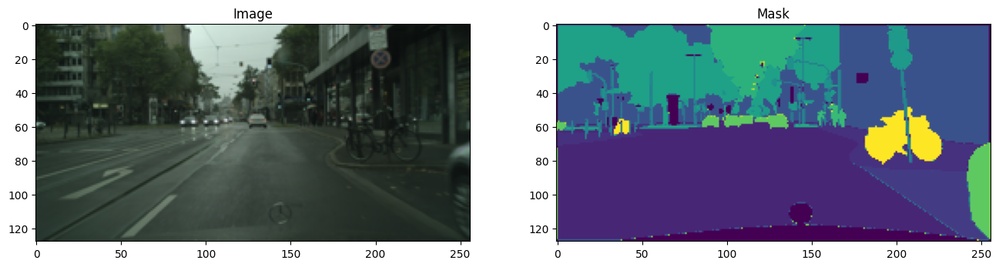

In [ ]:
def plot_pairs(data, labels, index=None):
    if index == None:
        index = np.random.randint(0,len(data))
    fig, axes = plt.subplots(1, 2, figsize=(16,4))
    axes[0].set_title("Image")
    axes[0].imshow(data[index])
    axes[1].set_title("Mask")
    colored_image = display_color_mapped_image_continuous(labels[index])
    axes[1].imshow(np.squeeze(colored_image))
    plt.show()
plot_pairs(X,y)

In [ ]:
# Split the data into training, validation, and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=300, random_state=seed)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=300, random_state=seed)

# Apply horizontal flip augmentation to the training set if specified
horizontal_flip = True

if horizontal_flip:
    X_train_flipped = np.flip(X_train, axis=2)
    X_train = np.concatenate([X_train, X_train_flipped], axis=0)
    y_train_flipped = np.flip(y_train, axis=2)
    y_train = np.concatenate([y_train, y_train_flipped], axis=0)

# Display the shapes of the resulting datasets
X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((4750, 128, 256, 3),
 (4750, 128, 256, 1),
 (300, 128, 256, 3),
 (300, 128, 256, 1),
 (300, 128, 256, 3),
 (300, 128, 256, 1))

In [ ]:
input_shape = X_train.shape[1:]
print('Input shape',input_shape)

Input shape (128, 256, 3)


In [ ]:
# Free some RAM
del X, y, data, labels

### Build a UNet

In [ ]:
def unet_block(input_tensor, filters, kernel_size=3, activation='relu', stack=2, name=''):

    x = input_tensor
    for i in range(stack):
        x = tfkl.Conv2D(filters, kernel_size=3, padding='same', name=name+'conv'+str(i+1))(x)
        x = tfkl.BatchNormalization(name=name+'bn'+str(i+1))(x)
        x = tfkl.Activation(activation, name=name+'activation'+str(i+1))(x)

    return x

In [ ]:
def get_unet_model(input_shape=input_shape, num_classes=num_classes, seed=seed):
    tf.random.set_seed(seed)
    input_layer = tfkl.Input(shape=input_shape, name='input_layer')

    # First Downsampling
    down_block_1 = unet_block(input_layer, 64, name='down_block1_')
    d1 = tfkl.MaxPooling2D()(down_block_1)

    # Second Downsampling
    down_block_2 = unet_block(d1, 128, name='down_block2_')
    d2 = tfkl.MaxPooling2D()(down_block_2)

    # Third Downsampling
    down_block_3 = unet_block(d2, 256, name='down_block3_')
    d3 = tfkl.MaxPooling2D()(down_block_3)

    # Fourth Downsampling
    down_block_4 = unet_block(d3, 512, name='down_block4_')
    d4 = tfkl.MaxPooling2D()(down_block_4)

    # Bottleneck
    bottleneck = unet_block(d4, 512, name='bottleneck')

    # First Upsampling
    u1 = tfkl.UpSampling2D()(bottleneck)
    u1 = tfkl.Add(name='add1')([u1,down_block_4])
    u1 = unet_block(u1, 256, name='up_block1_')

    # Second Upsampling
    u2 = tfkl.UpSampling2D()(u1)
    u2 = tfkl.Add(name='add2')([u2,down_block_3])
    u2 = unet_block(u2, 128, name='up_block2_')

    # Third Upsampling
    u3 = tfkl.UpSampling2D()(u2)
    u3 = tfkl.Add(name='add3')([u3,down_block_2])
    u3 = unet_block(u3, 64, name='up_block3_')

    # Forth Upsampling
    u4 = tfkl.UpSampling2D()(u3)
    u4 = tfkl.Add(name='add4')([u4,down_block_1])
    u4 = unet_block(u4, 64, name='up_block4_')

    # Output Layer
    output_layer = tf.keras.layers.Conv2D(num_classes, kernel_size=3, padding='same', activation="softmax", name='output_layer')(u4)

    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
    return model

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None, 128, 256, 3)]        0         []                            
                                                                                                  
 down_block1_conv1 (Conv2D)  (None, 128, 256, 64)         1792      ['input_layer[0][0]']         
                                                                                                  
 down_block1_bn1 (BatchNorm  (None, 128, 256, 64)         256       ['down_block1_conv1[0][0]']   
 alization)                                                                                       
                                                                                                  
 down_block1_activation1 (A  (None, 128, 256, 64)         0         ['down_block1_bn1[0][0]'] 

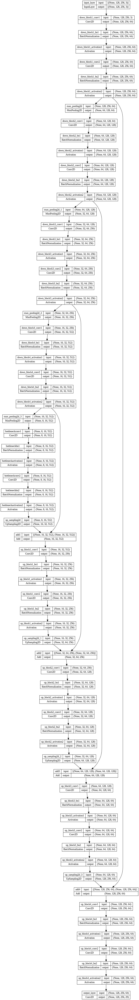

In [ ]:
model = get_unet_model()
model.summary()
tf.keras.utils.plot_model(model, show_shapes=True, expand_nested=True)

Custom Callbacks

In [ ]:
# Define a custom metric class for mean intersection over union (IoU)
class UpdatedMeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes=None, name="mean_iou", dtype=None):
        super(UpdatedMeanIoU, self).__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.math.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

# Define a callback class for visualization during training
class VizCallback(tf.keras.callbacks.Callback):

    def __init__(self, image, label):
        super().__init__()
        self.image = image
        self.label = label

    def on_epoch_end(self, epoch, logs=None):
        # Predict using the model and visualize ground truth vs predicted mask
        pred = model.predict(self.image, verbose=0)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (128, 256, 1))
        fig, axes = plt.subplots(1, 2, figsize=(16, 4))
        axes[0].imshow(np.squeeze(self.label))
        axes[0].set_title("Ground Truth Mask")
        colored_image = display_color_mapped_image_continuous(y_pred)
        axes[1].imshow(np.squeeze(colored_image))
        axes[1].set_title("Predicted Mask")
        plt.tight_layout()
        plt.show()

In [ ]:
learning_rate = 1e-3
batch_size = 16
epochs = 1000

In [ ]:
model.compile(
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer = tfk.optimizers.AdamW(learning_rate),
    metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes)]
    )

patience = 30
early_stopping = tfk.callbacks.EarlyStopping(monitor='val_mean_iou', mode='max', patience=patience, restore_best_weights=True)
viz_callback = VizCallback(np.expand_dims(X_val[0],axis=0), np.expand_dims(y_val[0],axis=0))
scheduler = tfk.callbacks.ReduceLROnPlateau(monitor='val_mean_iou', mode='max', factor=0.1, patience=patience-5, min_lr=1e-5)

Epoch 1/1000


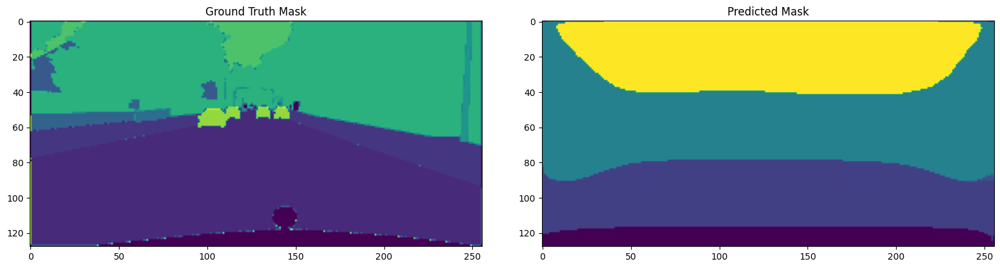

75/75 - 64s - loss: 1.1103 - accuracy: 0.7053 - mean_iou: 0.1371 - val_loss: 1.9820 - val_accuracy: 0.4504 - val_mean_iou: 0.0526 - lr: 0.0010 - 64s/epoch - 855ms/step
Epoch 2/1000


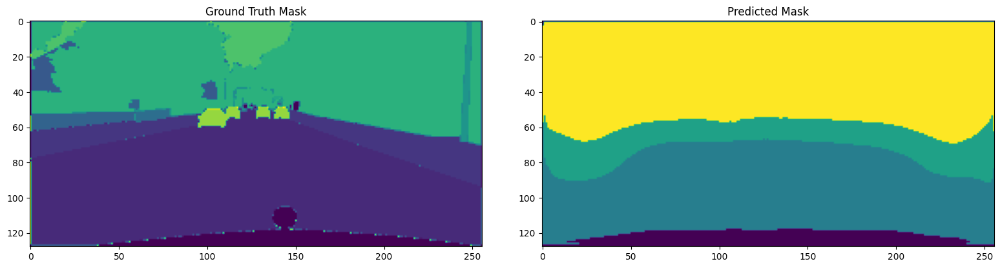

75/75 - 40s - loss: 0.7660 - accuracy: 0.7903 - mean_iou: 0.1914 - val_loss: 1.9610 - val_accuracy: 0.5388 - val_mean_iou: 0.0611 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 3/1000


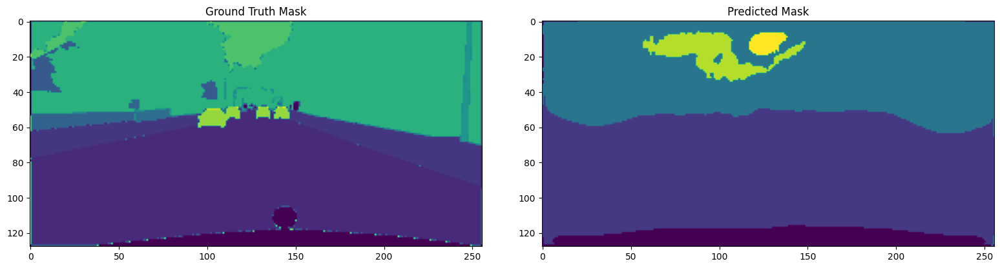

75/75 - 40s - loss: 0.6816 - accuracy: 0.8115 - mean_iou: 0.2163 - val_loss: 2.0404 - val_accuracy: 0.5731 - val_mean_iou: 0.0659 - lr: 0.0010 - 40s/epoch - 538ms/step
Epoch 4/1000


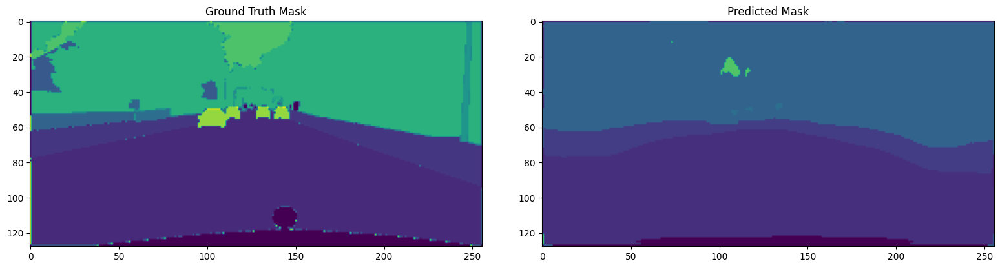

75/75 - 40s - loss: 0.6265 - accuracy: 0.8259 - mean_iou: 0.2416 - val_loss: 2.2999 - val_accuracy: 0.5345 - val_mean_iou: 0.0592 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 5/1000


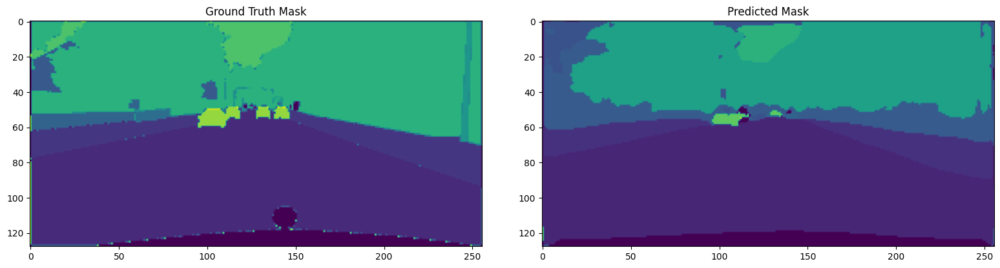

75/75 - 40s - loss: 0.5798 - accuracy: 0.8366 - mean_iou: 0.2658 - val_loss: 1.2006 - val_accuracy: 0.6913 - val_mean_iou: 0.1339 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 6/1000


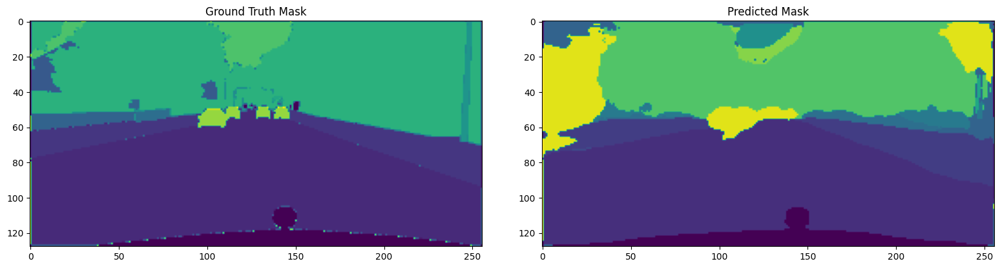

75/75 - 40s - loss: 0.5441 - accuracy: 0.8450 - mean_iou: 0.2853 - val_loss: 1.0310 - val_accuracy: 0.7354 - val_mean_iou: 0.1697 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 7/1000


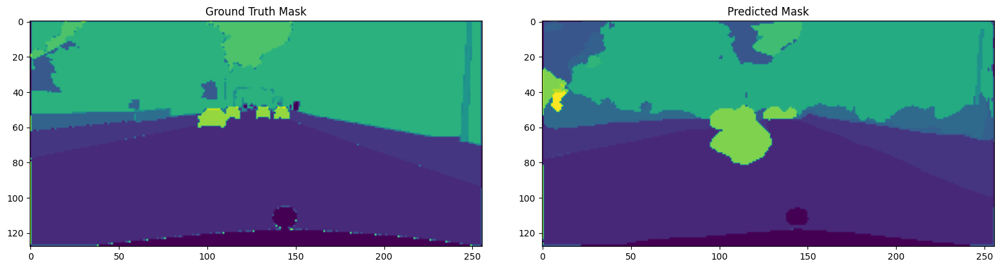

75/75 - 40s - loss: 0.5196 - accuracy: 0.8509 - mean_iou: 0.2992 - val_loss: 1.1279 - val_accuracy: 0.6972 - val_mean_iou: 0.1759 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 8/1000


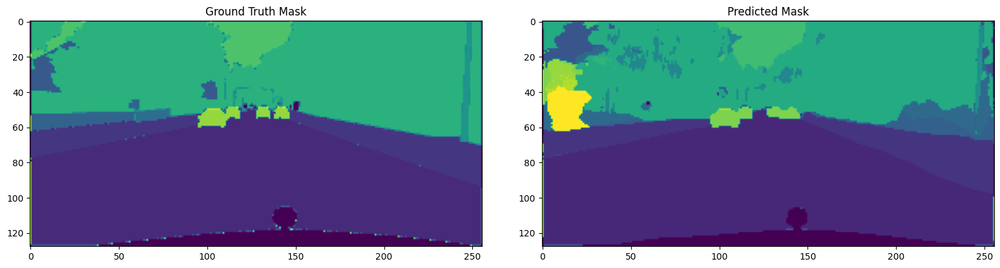

75/75 - 40s - loss: 0.4928 - accuracy: 0.8578 - mean_iou: 0.3184 - val_loss: 0.7272 - val_accuracy: 0.7986 - val_mean_iou: 0.2432 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 9/1000


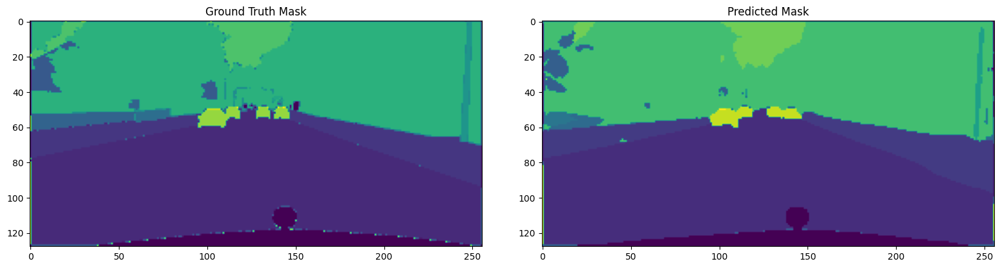

75/75 - 40s - loss: 0.4795 - accuracy: 0.8607 - mean_iou: 0.3290 - val_loss: 0.5847 - val_accuracy: 0.8407 - val_mean_iou: 0.2801 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 10/1000


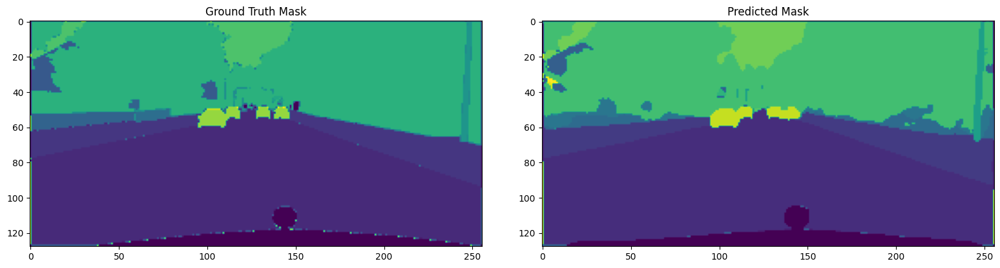

75/75 - 40s - loss: 0.4586 - accuracy: 0.8664 - mean_iou: 0.3452 - val_loss: 0.6810 - val_accuracy: 0.8064 - val_mean_iou: 0.2729 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 11/1000


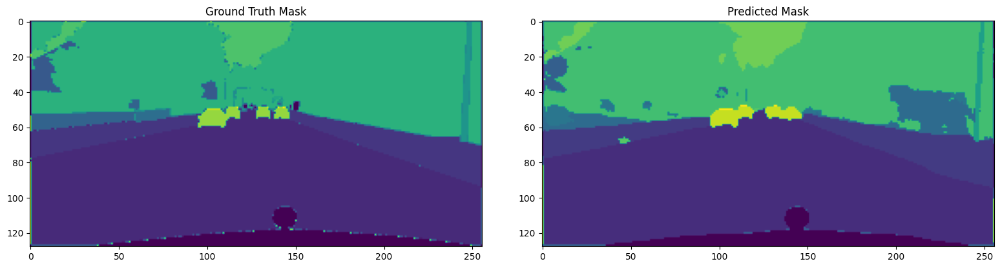

75/75 - 40s - loss: 0.4416 - accuracy: 0.8711 - mean_iou: 0.3596 - val_loss: 0.5917 - val_accuracy: 0.8342 - val_mean_iou: 0.2925 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 12/1000


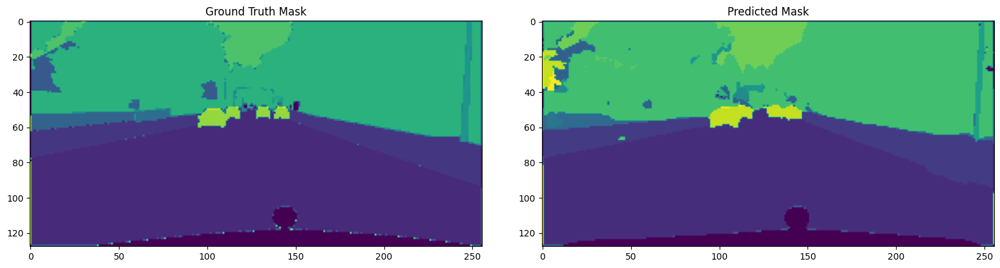

75/75 - 40s - loss: 0.4237 - accuracy: 0.8757 - mean_iou: 0.3784 - val_loss: 0.5751 - val_accuracy: 0.8343 - val_mean_iou: 0.3078 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 13/1000


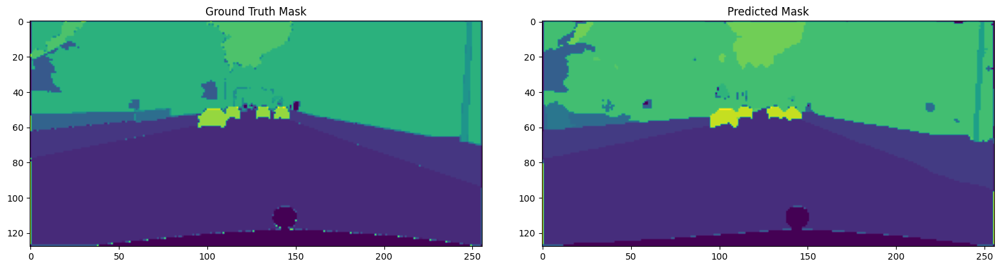

75/75 - 40s - loss: 0.4108 - accuracy: 0.8791 - mean_iou: 0.3904 - val_loss: 0.5663 - val_accuracy: 0.8430 - val_mean_iou: 0.3032 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 14/1000


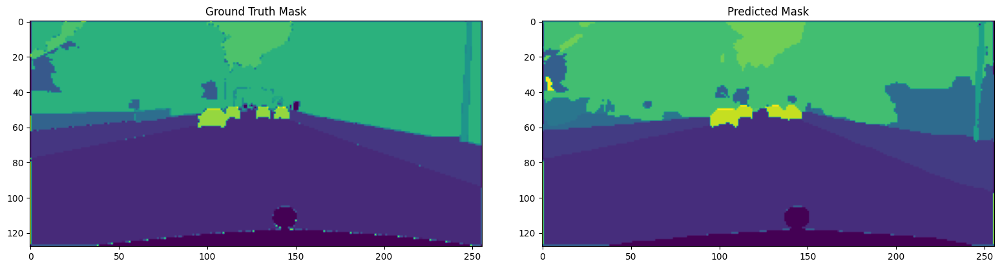

75/75 - 40s - loss: 0.3944 - accuracy: 0.8840 - mean_iou: 0.4090 - val_loss: 0.5340 - val_accuracy: 0.8490 - val_mean_iou: 0.3294 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 15/1000


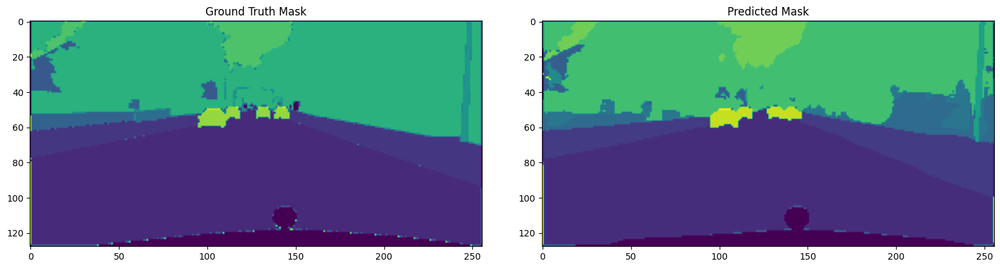

75/75 - 40s - loss: 0.3828 - accuracy: 0.8873 - mean_iou: 0.4213 - val_loss: 0.5329 - val_accuracy: 0.8490 - val_mean_iou: 0.3332 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 16/1000


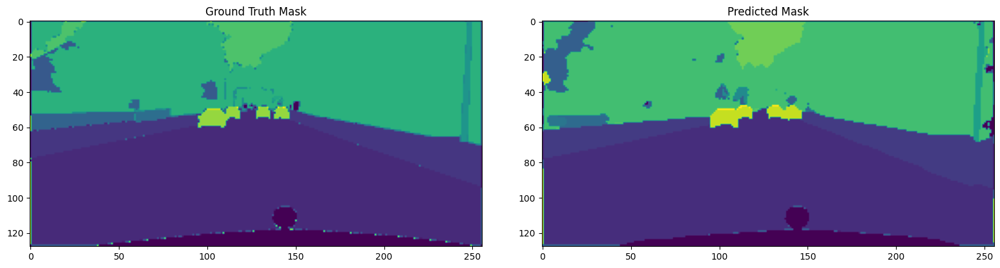

75/75 - 40s - loss: 0.3636 - accuracy: 0.8929 - mean_iou: 0.4334 - val_loss: 0.5491 - val_accuracy: 0.8437 - val_mean_iou: 0.3281 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 17/1000


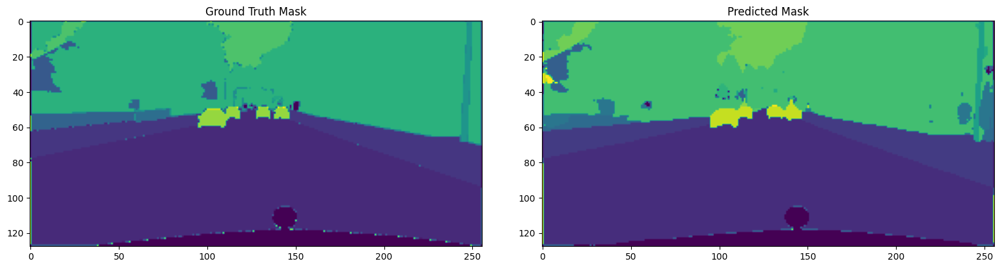

75/75 - 40s - loss: 0.3565 - accuracy: 0.8947 - mean_iou: 0.4503 - val_loss: 0.5091 - val_accuracy: 0.8623 - val_mean_iou: 0.3354 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 18/1000


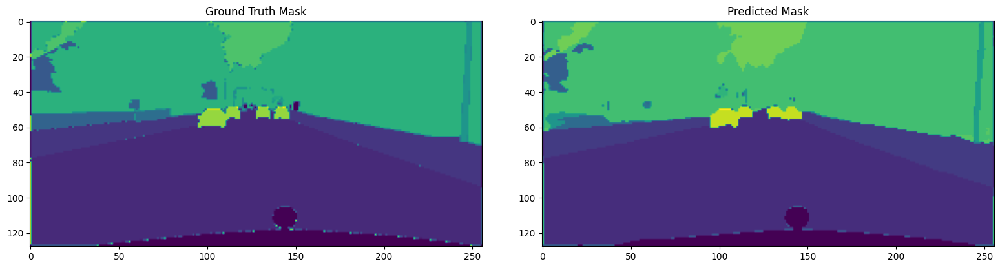

75/75 - 40s - loss: 0.3454 - accuracy: 0.8976 - mean_iou: 0.4648 - val_loss: 0.5493 - val_accuracy: 0.8479 - val_mean_iou: 0.3343 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 19/1000


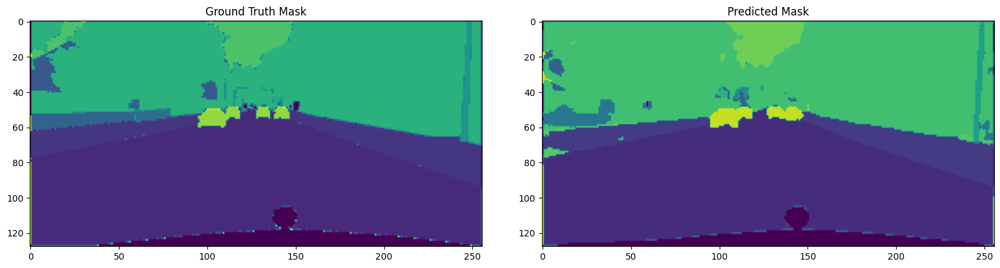

75/75 - 40s - loss: 0.3304 - accuracy: 0.9021 - mean_iou: 0.4806 - val_loss: 0.4903 - val_accuracy: 0.8634 - val_mean_iou: 0.3495 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 20/1000


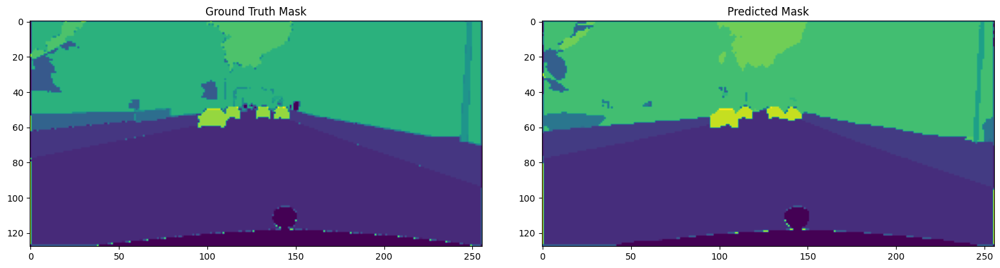

75/75 - 40s - loss: 0.3238 - accuracy: 0.9038 - mean_iou: 0.4930 - val_loss: 0.4957 - val_accuracy: 0.8638 - val_mean_iou: 0.3405 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 21/1000


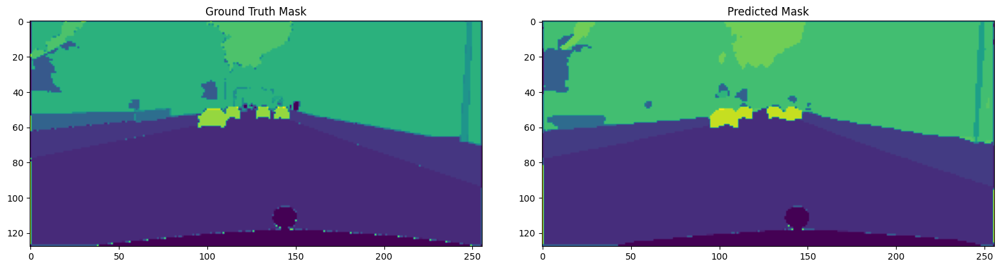

75/75 - 40s - loss: 0.3040 - accuracy: 0.9098 - mean_iou: 0.5151 - val_loss: 0.4927 - val_accuracy: 0.8664 - val_mean_iou: 0.3505 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 22/1000


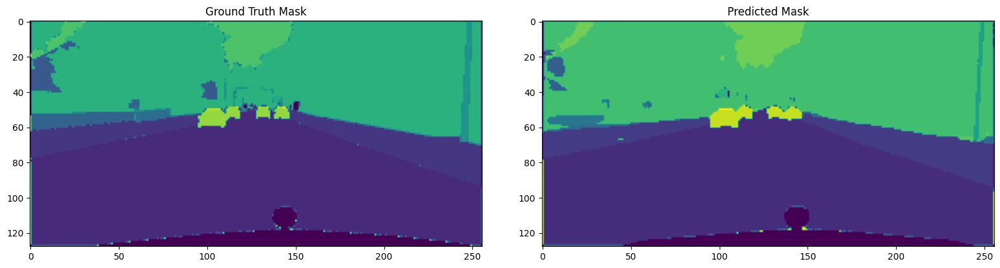

75/75 - 40s - loss: 0.2951 - accuracy: 0.9123 - mean_iou: 0.5260 - val_loss: 0.5221 - val_accuracy: 0.8563 - val_mean_iou: 0.3554 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 23/1000


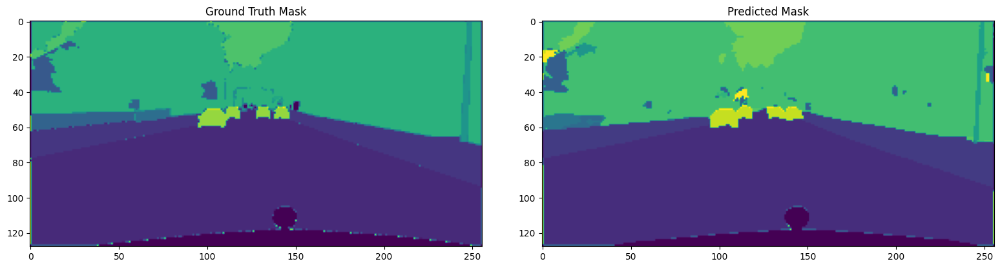

75/75 - 40s - loss: 0.3011 - accuracy: 0.9102 - mean_iou: 0.5147 - val_loss: 0.5101 - val_accuracy: 0.8656 - val_mean_iou: 0.3523 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 24/1000


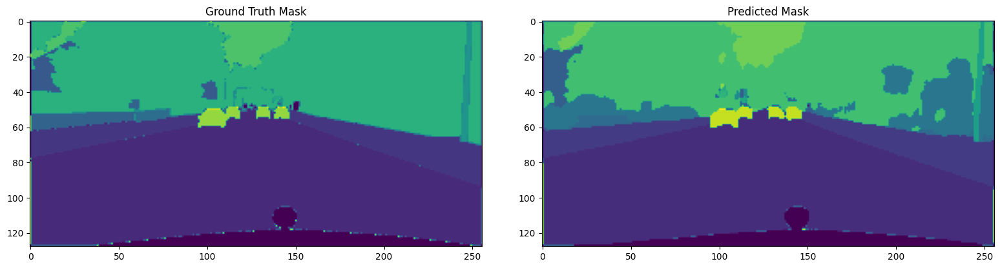

75/75 - 40s - loss: 0.2908 - accuracy: 0.9131 - mean_iou: 0.5370 - val_loss: 0.5046 - val_accuracy: 0.8663 - val_mean_iou: 0.3533 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 25/1000


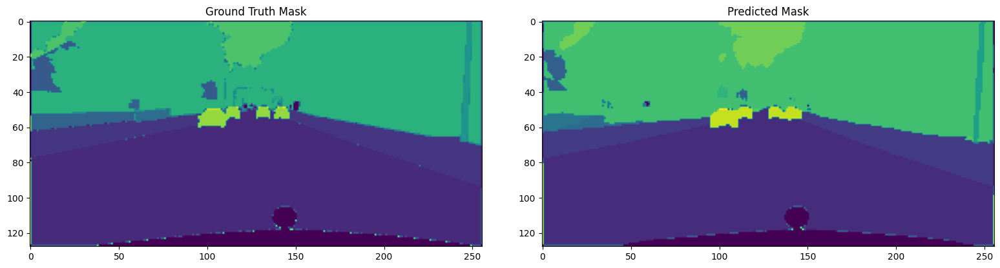

75/75 - 40s - loss: 0.2839 - accuracy: 0.9151 - mean_iou: 0.5454 - val_loss: 0.4892 - val_accuracy: 0.8687 - val_mean_iou: 0.3718 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 26/1000


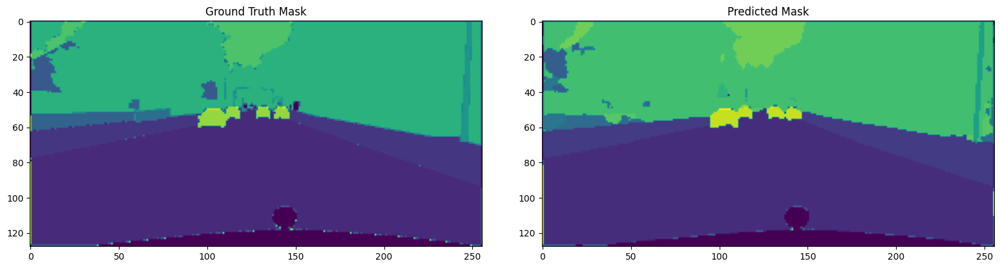

75/75 - 40s - loss: 0.2837 - accuracy: 0.9150 - mean_iou: 0.5406 - val_loss: 0.5069 - val_accuracy: 0.8656 - val_mean_iou: 0.3689 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 27/1000


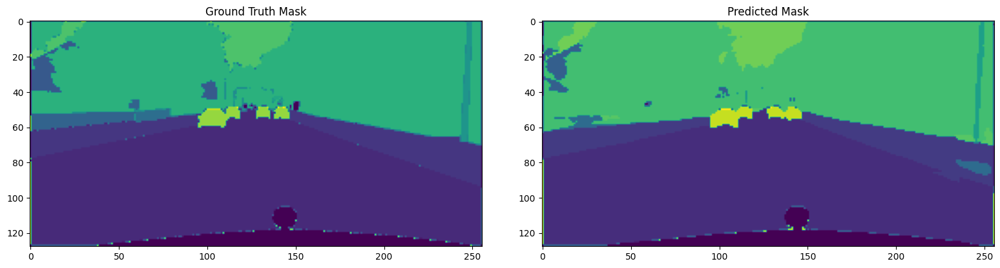

75/75 - 40s - loss: 0.2625 - accuracy: 0.9214 - mean_iou: 0.5697 - val_loss: 0.5034 - val_accuracy: 0.8707 - val_mean_iou: 0.3684 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 28/1000


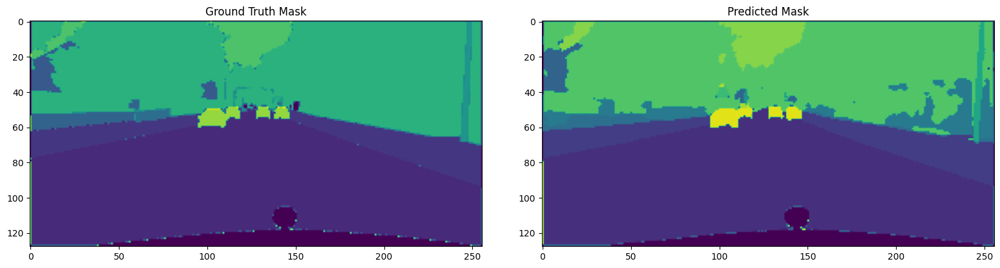

75/75 - 40s - loss: 0.2525 - accuracy: 0.9243 - mean_iou: 0.5819 - val_loss: 0.4828 - val_accuracy: 0.8769 - val_mean_iou: 0.3774 - lr: 0.0010 - 40s/epoch - 537ms/step
Epoch 29/1000


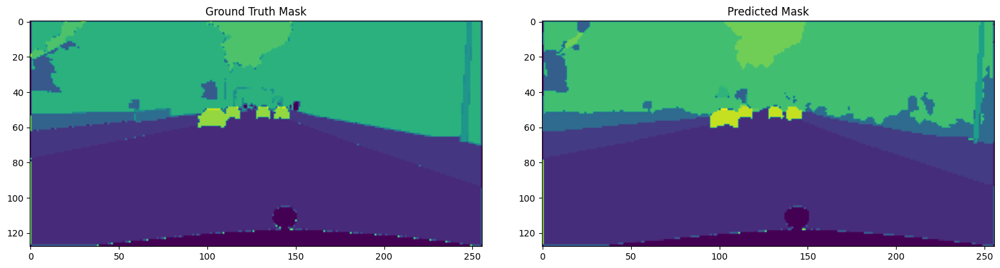

75/75 - 40s - loss: 0.2428 - accuracy: 0.9271 - mean_iou: 0.5933 - val_loss: 0.5330 - val_accuracy: 0.8707 - val_mean_iou: 0.3463 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 30/1000


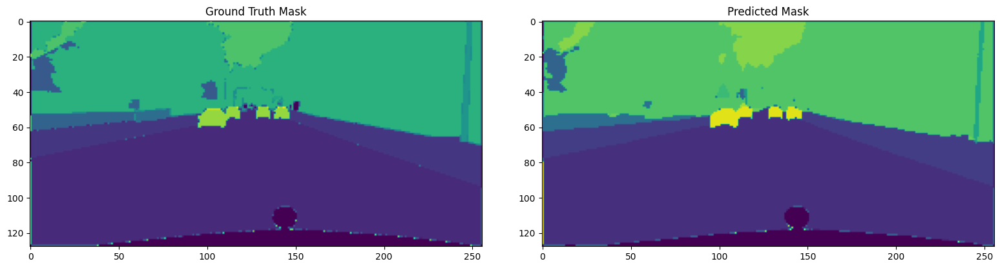

75/75 - 40s - loss: 0.2364 - accuracy: 0.9289 - mean_iou: 0.5997 - val_loss: 0.4870 - val_accuracy: 0.8795 - val_mean_iou: 0.3859 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 31/1000


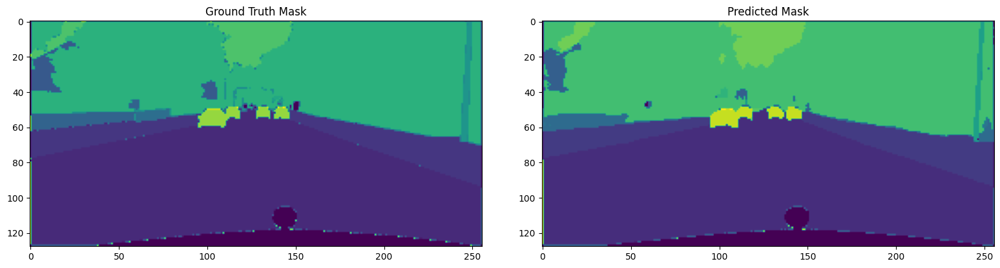

75/75 - 40s - loss: 0.2289 - accuracy: 0.9309 - mean_iou: 0.6085 - val_loss: 0.5233 - val_accuracy: 0.8723 - val_mean_iou: 0.3750 - lr: 0.0010 - 40s/epoch - 538ms/step
Epoch 32/1000


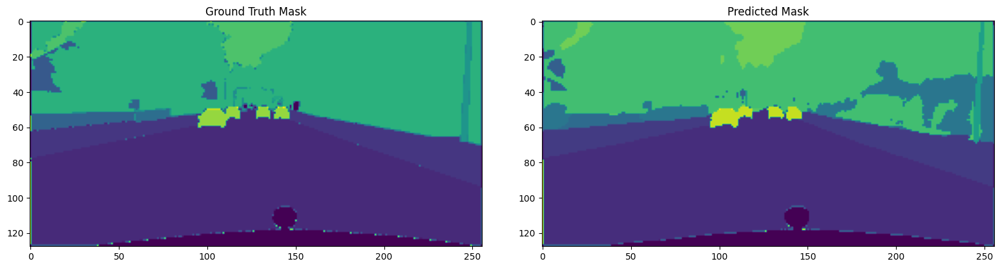

75/75 - 40s - loss: 0.2250 - accuracy: 0.9320 - mean_iou: 0.6148 - val_loss: 0.5626 - val_accuracy: 0.8625 - val_mean_iou: 0.3688 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 33/1000


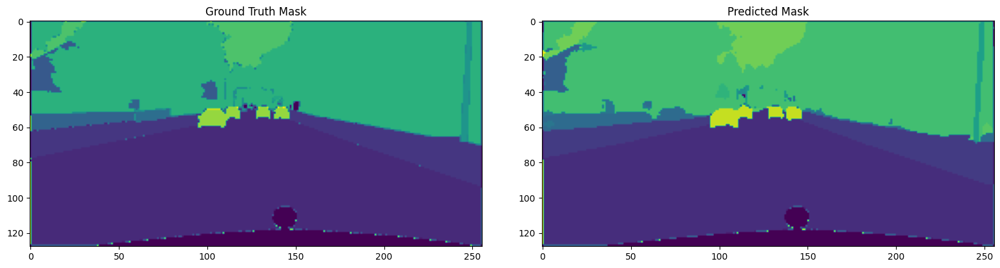

75/75 - 40s - loss: 0.2323 - accuracy: 0.9296 - mean_iou: 0.6065 - val_loss: 0.5019 - val_accuracy: 0.8745 - val_mean_iou: 0.3862 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 34/1000


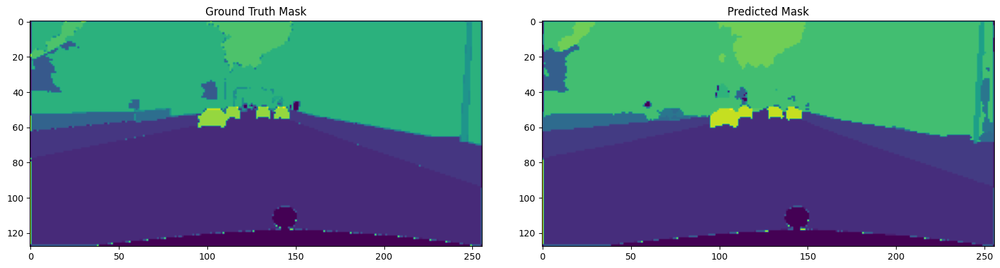

75/75 - 40s - loss: 0.2140 - accuracy: 0.9351 - mean_iou: 0.6271 - val_loss: 0.4921 - val_accuracy: 0.8813 - val_mean_iou: 0.3805 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 35/1000


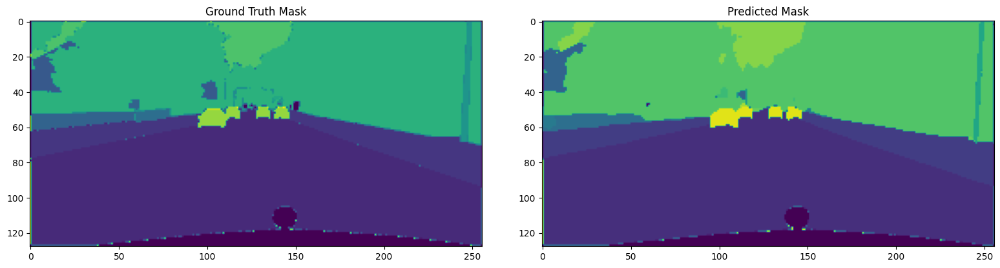

75/75 - 40s - loss: 0.2103 - accuracy: 0.9360 - mean_iou: 0.6327 - val_loss: 0.5151 - val_accuracy: 0.8817 - val_mean_iou: 0.3854 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 36/1000


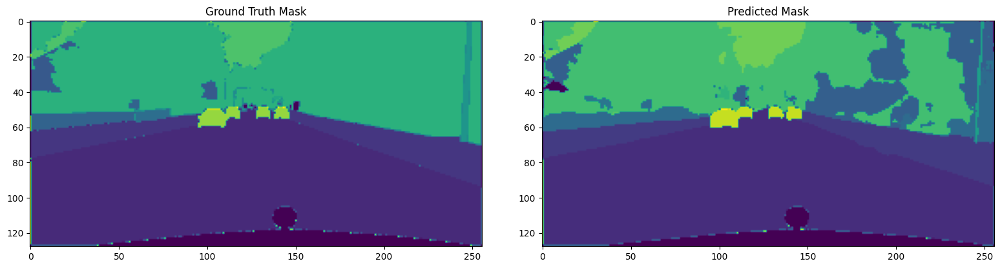

75/75 - 40s - loss: 0.2145 - accuracy: 0.9346 - mean_iou: 0.6259 - val_loss: 0.6474 - val_accuracy: 0.8490 - val_mean_iou: 0.3486 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 37/1000


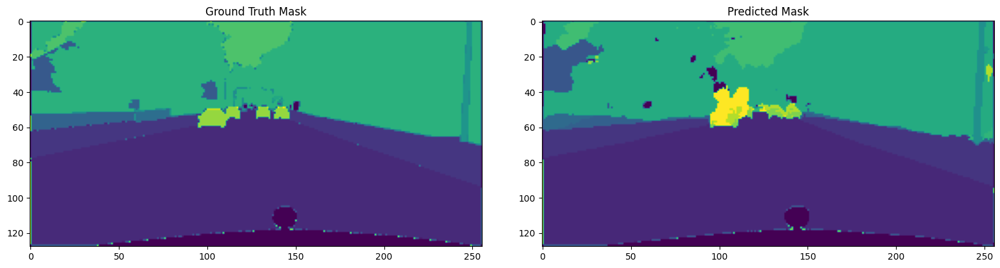

75/75 - 40s - loss: 0.2798 - accuracy: 0.9153 - mean_iou: 0.5445 - val_loss: 0.9720 - val_accuracy: 0.7976 - val_mean_iou: 0.2651 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 38/1000


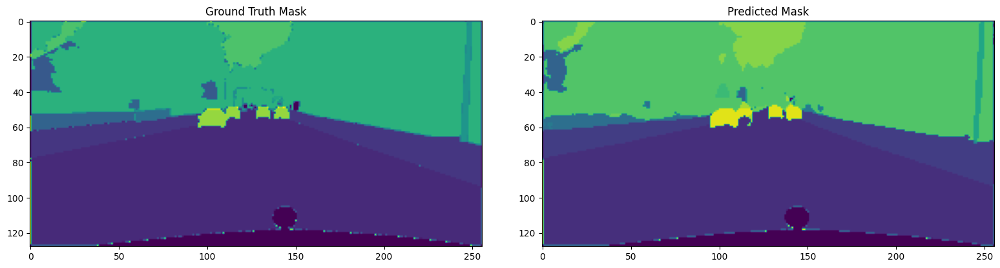

75/75 - 40s - loss: 0.2314 - accuracy: 0.9296 - mean_iou: 0.6048 - val_loss: 0.4815 - val_accuracy: 0.8821 - val_mean_iou: 0.3860 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 39/1000


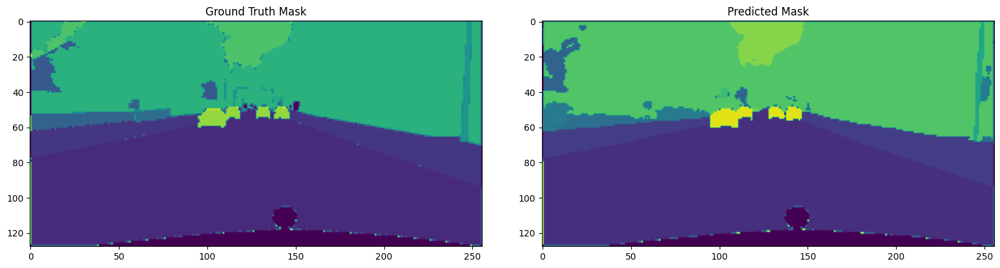

75/75 - 40s - loss: 0.2022 - accuracy: 0.9384 - mean_iou: 0.6424 - val_loss: 0.5185 - val_accuracy: 0.8744 - val_mean_iou: 0.3739 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 40/1000


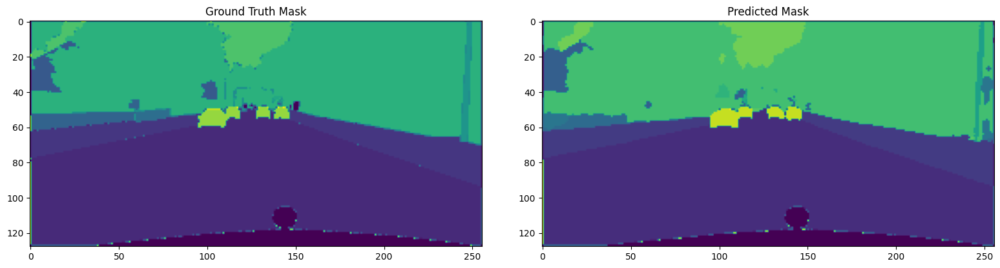

75/75 - 40s - loss: 0.1950 - accuracy: 0.9403 - mean_iou: 0.6510 - val_loss: 0.5127 - val_accuracy: 0.8791 - val_mean_iou: 0.3842 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 41/1000


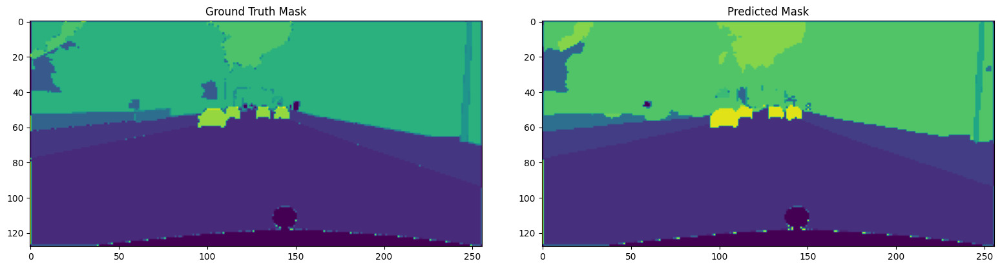

75/75 - 40s - loss: 0.1875 - accuracy: 0.9424 - mean_iou: 0.6585 - val_loss: 0.5099 - val_accuracy: 0.8844 - val_mean_iou: 0.3981 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 42/1000


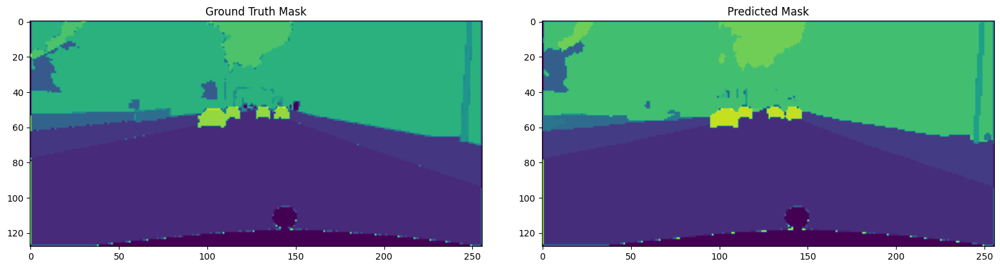

75/75 - 40s - loss: 0.1845 - accuracy: 0.9432 - mean_iou: 0.6615 - val_loss: 0.5134 - val_accuracy: 0.8825 - val_mean_iou: 0.3993 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 43/1000


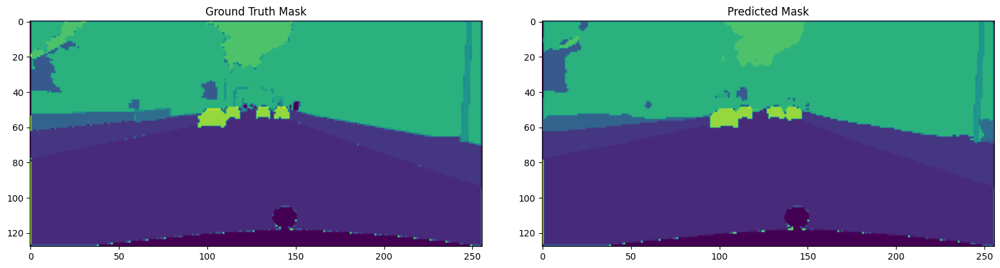

75/75 - 40s - loss: 0.1855 - accuracy: 0.9428 - mean_iou: 0.6604 - val_loss: 0.5437 - val_accuracy: 0.8806 - val_mean_iou: 0.3983 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 44/1000


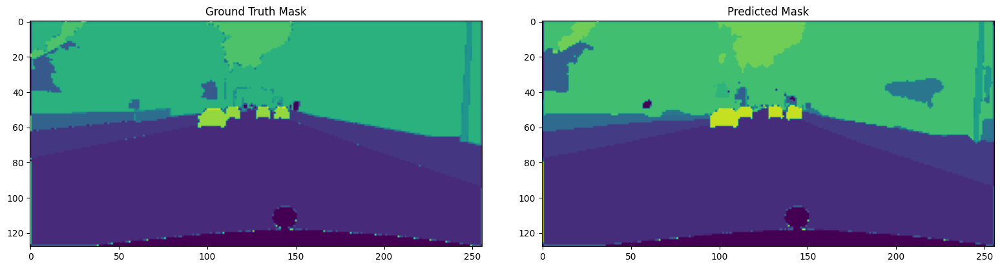

75/75 - 40s - loss: 0.2033 - accuracy: 0.9374 - mean_iou: 0.6385 - val_loss: 0.5446 - val_accuracy: 0.8763 - val_mean_iou: 0.3869 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 45/1000


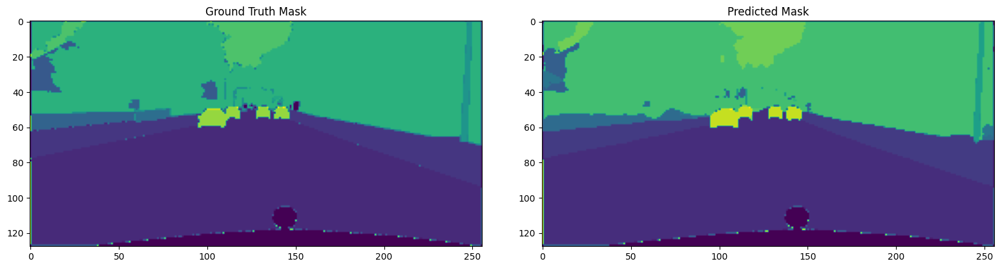

75/75 - 40s - loss: 0.1899 - accuracy: 0.9414 - mean_iou: 0.6531 - val_loss: 0.5178 - val_accuracy: 0.8842 - val_mean_iou: 0.4022 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 46/1000


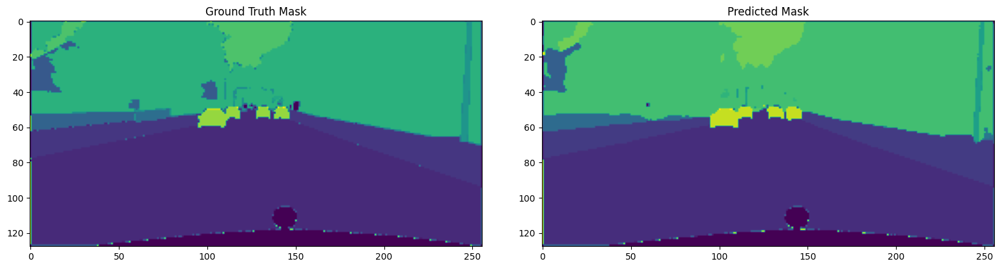

75/75 - 40s - loss: 0.1783 - accuracy: 0.9448 - mean_iou: 0.6686 - val_loss: 0.5380 - val_accuracy: 0.8822 - val_mean_iou: 0.3941 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 47/1000


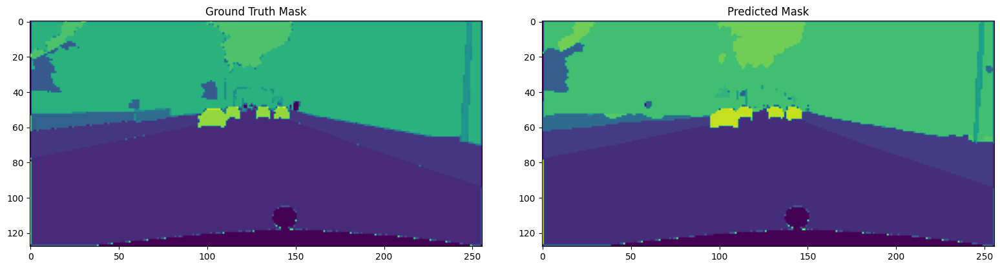

75/75 - 40s - loss: 0.1723 - accuracy: 0.9466 - mean_iou: 0.6749 - val_loss: 0.5325 - val_accuracy: 0.8844 - val_mean_iou: 0.3946 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 48/1000


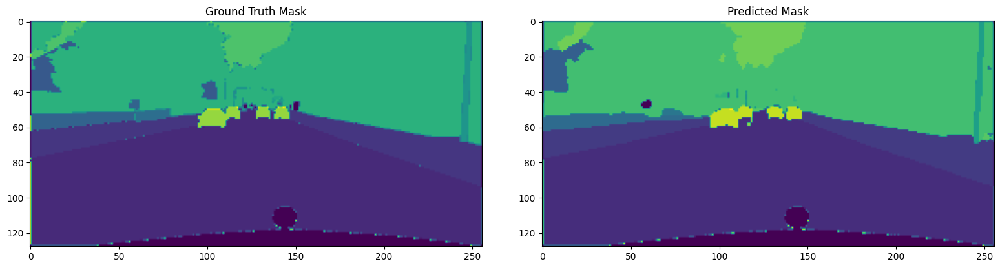

75/75 - 40s - loss: 0.1687 - accuracy: 0.9475 - mean_iou: 0.6792 - val_loss: 0.5408 - val_accuracy: 0.8839 - val_mean_iou: 0.3980 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 49/1000


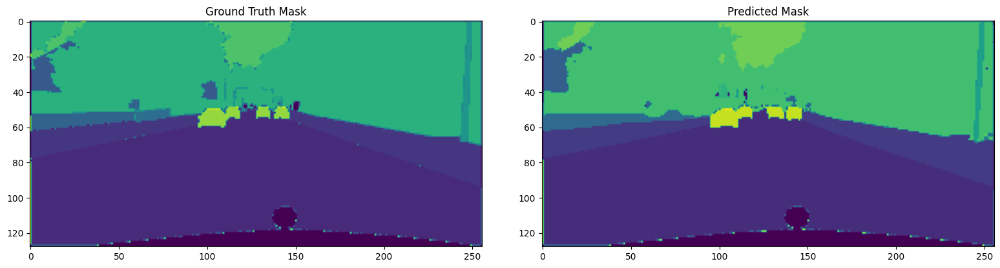

75/75 - 40s - loss: 0.1651 - accuracy: 0.9485 - mean_iou: 0.6823 - val_loss: 0.5478 - val_accuracy: 0.8840 - val_mean_iou: 0.3930 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 50/1000


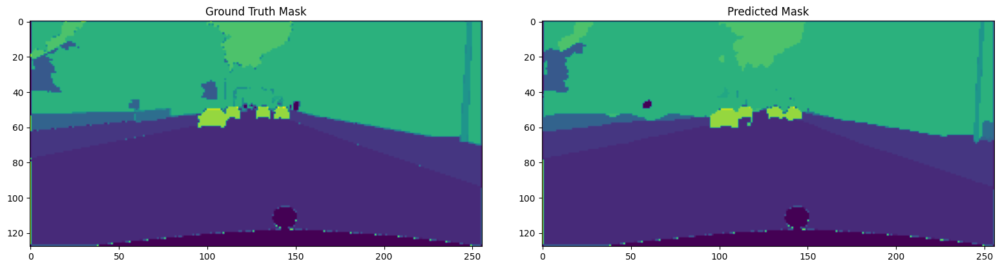

75/75 - 40s - loss: 0.1663 - accuracy: 0.9481 - mean_iou: 0.6806 - val_loss: 0.5440 - val_accuracy: 0.8833 - val_mean_iou: 0.4053 - lr: 0.0010 - 40s/epoch - 536ms/step
Epoch 51/1000


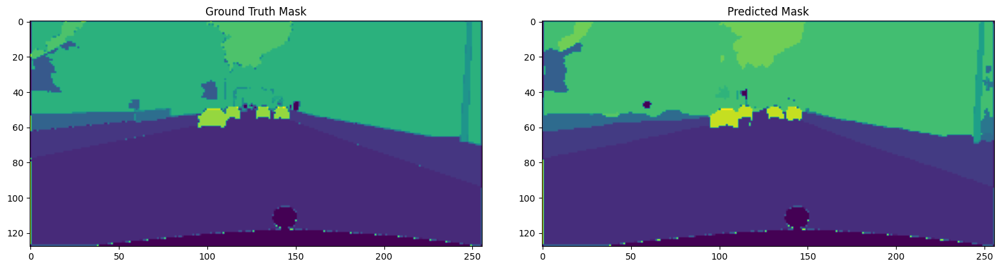

75/75 - 40s - loss: 0.1625 - accuracy: 0.9492 - mean_iou: 0.6854 - val_loss: 0.5595 - val_accuracy: 0.8862 - val_mean_iou: 0.4092 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 52/1000


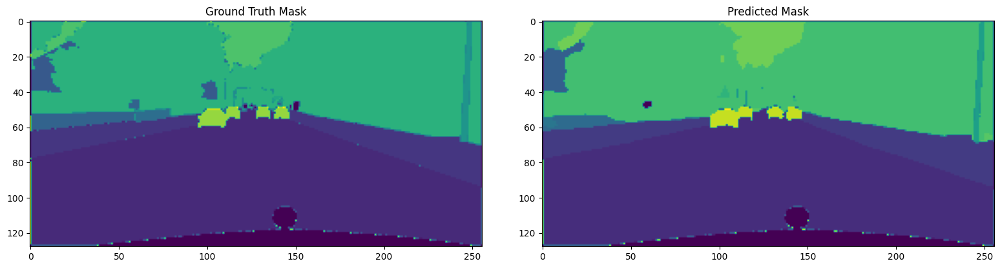

75/75 - 40s - loss: 0.1587 - accuracy: 0.9503 - mean_iou: 0.6888 - val_loss: 0.5611 - val_accuracy: 0.8828 - val_mean_iou: 0.4026 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 53/1000


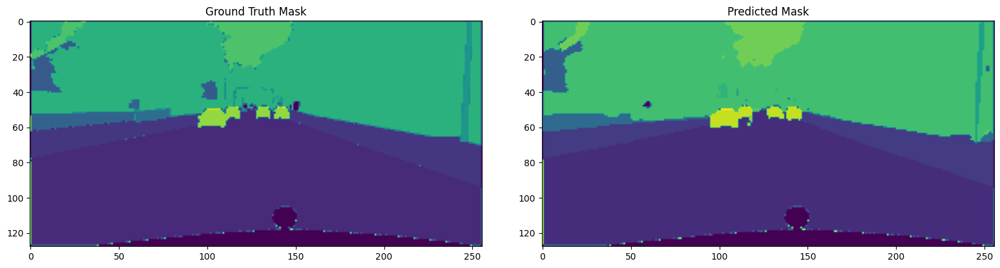

75/75 - 40s - loss: 0.1596 - accuracy: 0.9500 - mean_iou: 0.6873 - val_loss: 0.5758 - val_accuracy: 0.8811 - val_mean_iou: 0.3957 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 54/1000


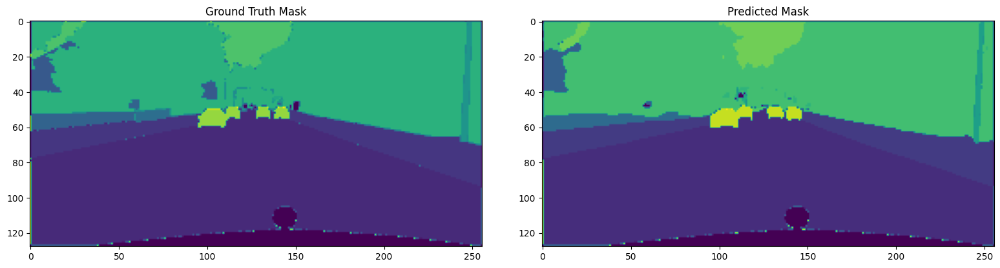

75/75 - 40s - loss: 0.1572 - accuracy: 0.9507 - mean_iou: 0.6899 - val_loss: 0.5707 - val_accuracy: 0.8819 - val_mean_iou: 0.3877 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 55/1000


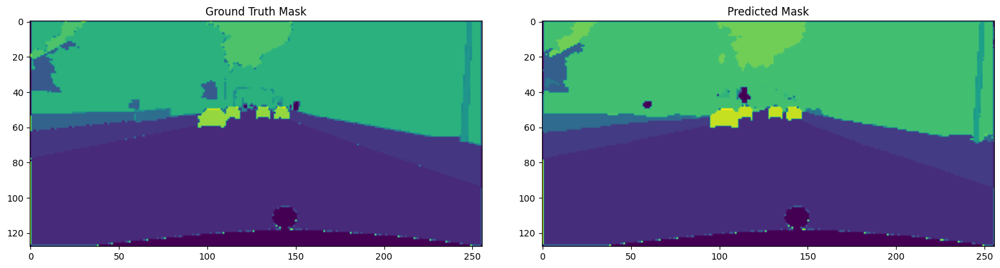

75/75 - 40s - loss: 0.1572 - accuracy: 0.9507 - mean_iou: 0.6903 - val_loss: 0.5410 - val_accuracy: 0.8862 - val_mean_iou: 0.4023 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 56/1000


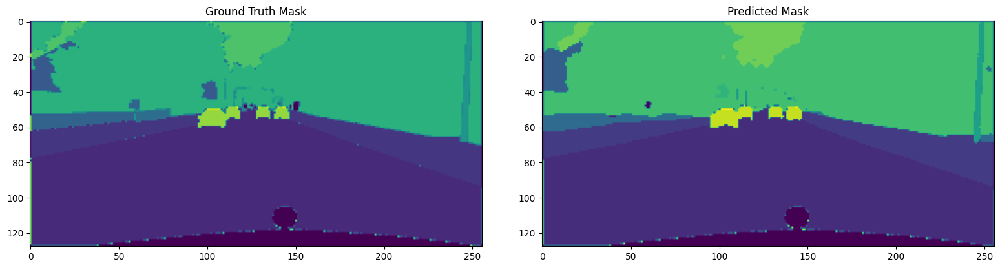

75/75 - 40s - loss: 0.1533 - accuracy: 0.9518 - mean_iou: 0.6946 - val_loss: 0.5637 - val_accuracy: 0.8849 - val_mean_iou: 0.3983 - lr: 0.0010 - 40s/epoch - 537ms/step
Epoch 57/1000


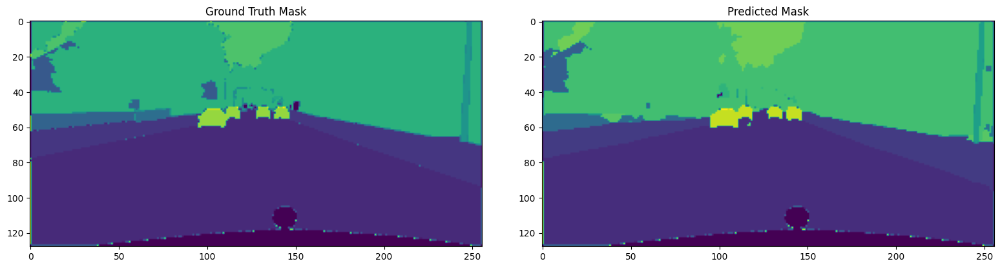

75/75 - 40s - loss: 0.1495 - accuracy: 0.9529 - mean_iou: 0.6983 - val_loss: 0.5619 - val_accuracy: 0.8792 - val_mean_iou: 0.3955 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 58/1000


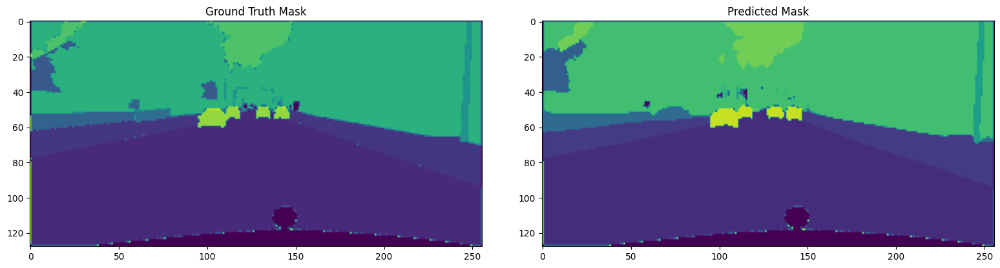

75/75 - 40s - loss: 0.1508 - accuracy: 0.9525 - mean_iou: 0.6969 - val_loss: 0.5533 - val_accuracy: 0.8835 - val_mean_iou: 0.4055 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 59/1000


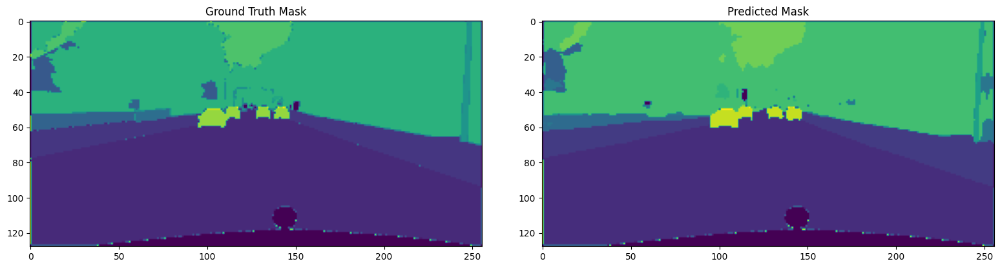

75/75 - 40s - loss: 0.1541 - accuracy: 0.9515 - mean_iou: 0.6942 - val_loss: 0.5923 - val_accuracy: 0.8810 - val_mean_iou: 0.3958 - lr: 0.0010 - 40s/epoch - 540ms/step
Epoch 60/1000


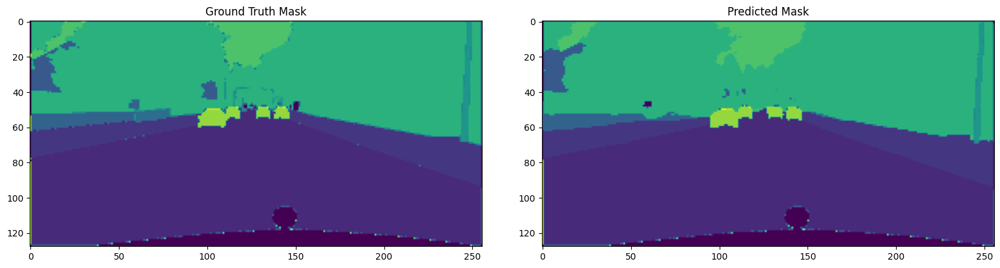

75/75 - 40s - loss: 0.1670 - accuracy: 0.9477 - mean_iou: 0.6764 - val_loss: 0.5967 - val_accuracy: 0.8810 - val_mean_iou: 0.3917 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 61/1000


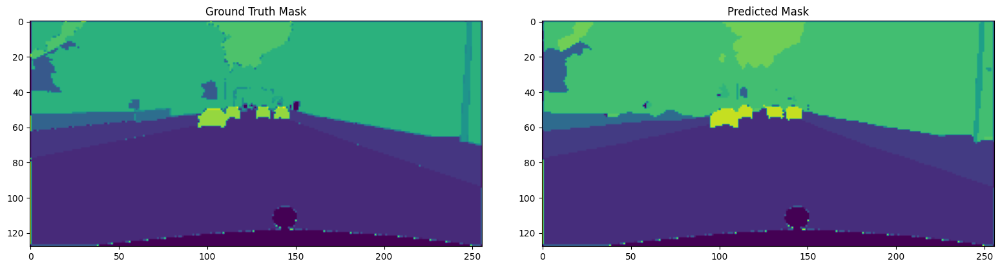

75/75 - 40s - loss: 0.1529 - accuracy: 0.9518 - mean_iou: 0.6931 - val_loss: 0.5752 - val_accuracy: 0.8843 - val_mean_iou: 0.4039 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 62/1000


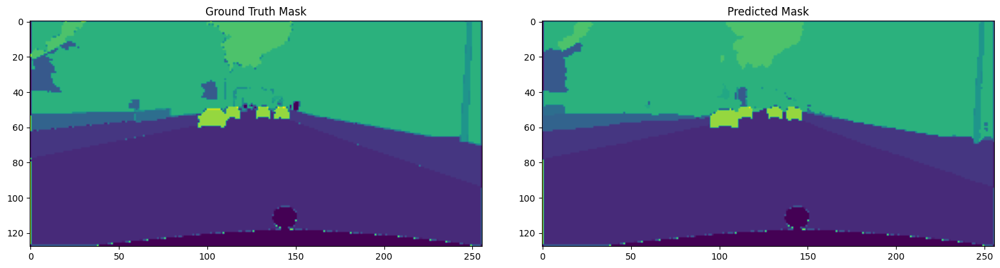

75/75 - 40s - loss: 0.1433 - accuracy: 0.9546 - mean_iou: 0.7052 - val_loss: 0.5698 - val_accuracy: 0.8861 - val_mean_iou: 0.4020 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 63/1000


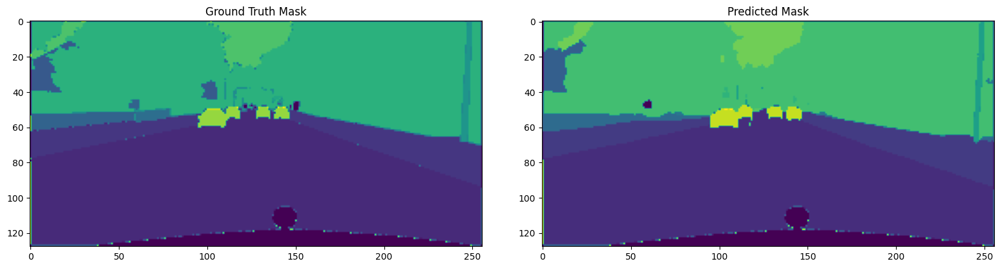

75/75 - 40s - loss: 0.1401 - accuracy: 0.9554 - mean_iou: 0.7095 - val_loss: 0.5808 - val_accuracy: 0.8840 - val_mean_iou: 0.4032 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 64/1000


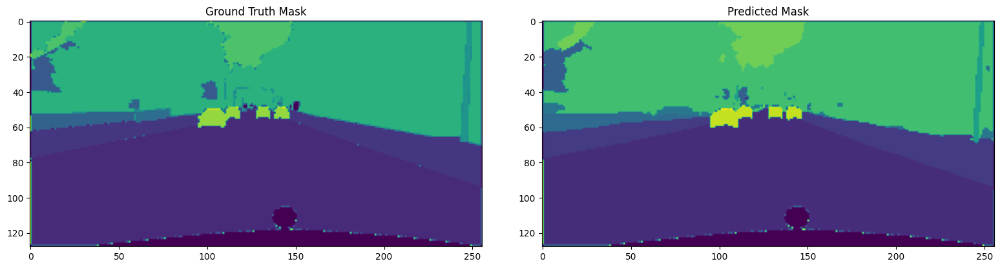

75/75 - 40s - loss: 0.1377 - accuracy: 0.9561 - mean_iou: 0.7124 - val_loss: 0.6076 - val_accuracy: 0.8839 - val_mean_iou: 0.3935 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 65/1000


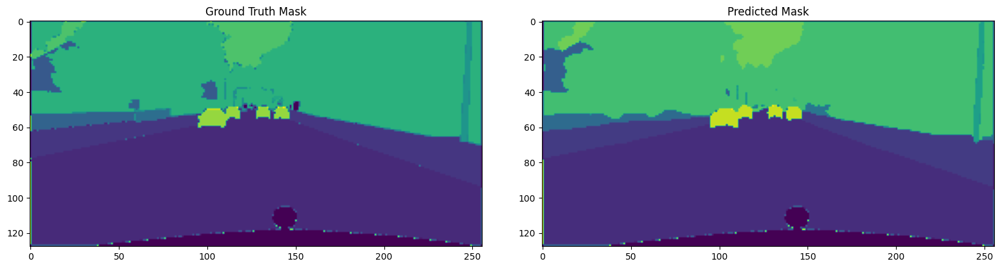

75/75 - 40s - loss: 0.1382 - accuracy: 0.9559 - mean_iou: 0.7116 - val_loss: 0.5858 - val_accuracy: 0.8844 - val_mean_iou: 0.4065 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 66/1000


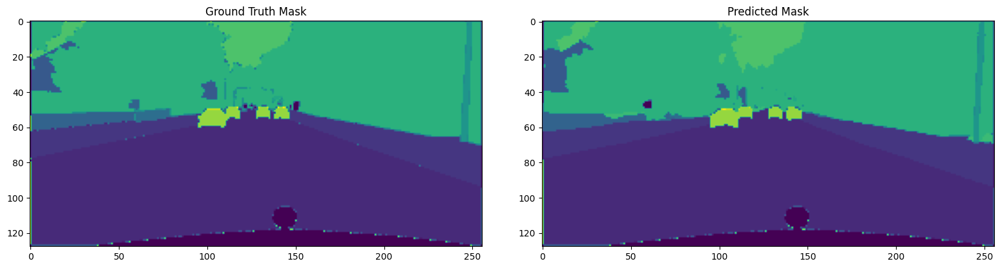

75/75 - 40s - loss: 0.1365 - accuracy: 0.9564 - mean_iou: 0.7126 - val_loss: 0.6003 - val_accuracy: 0.8850 - val_mean_iou: 0.3993 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 67/1000


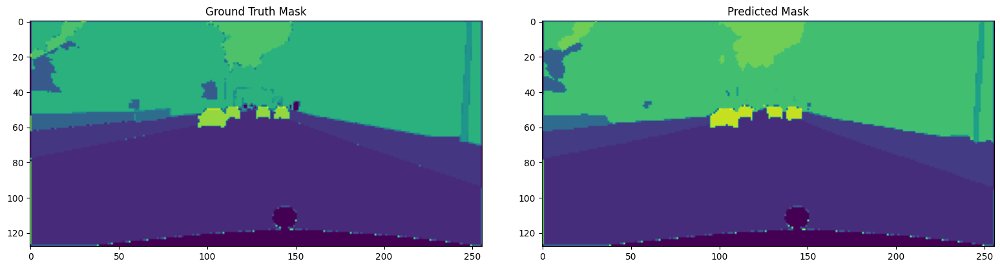

75/75 - 40s - loss: 0.1369 - accuracy: 0.9562 - mean_iou: 0.7118 - val_loss: 0.6094 - val_accuracy: 0.8843 - val_mean_iou: 0.3974 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 68/1000


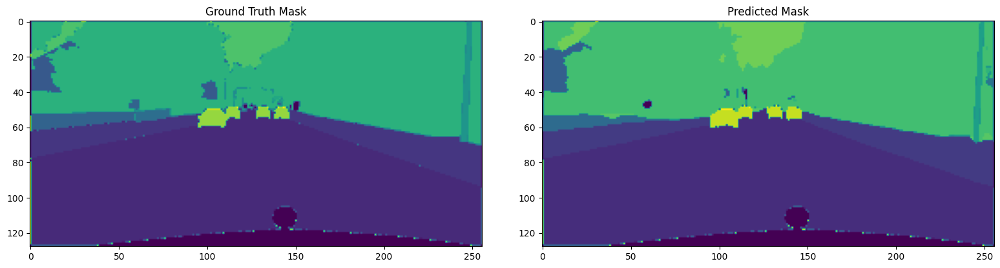

75/75 - 40s - loss: 0.1363 - accuracy: 0.9564 - mean_iou: 0.7110 - val_loss: 0.6315 - val_accuracy: 0.8862 - val_mean_iou: 0.3944 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 69/1000


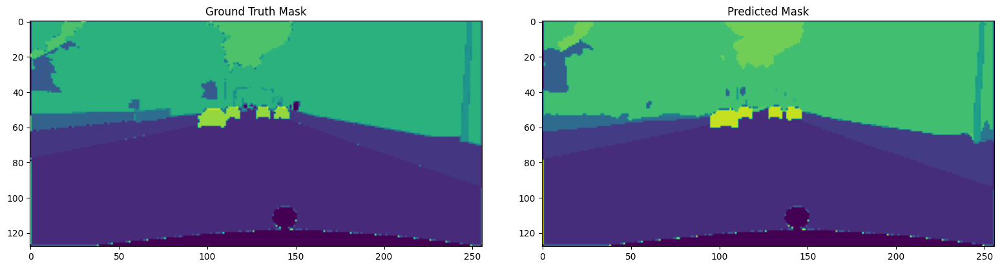

75/75 - 40s - loss: 0.1344 - accuracy: 0.9569 - mean_iou: 0.7145 - val_loss: 0.7882 - val_accuracy: 0.8575 - val_mean_iou: 0.3954 - lr: 0.0010 - 40s/epoch - 536ms/step
Epoch 70/1000


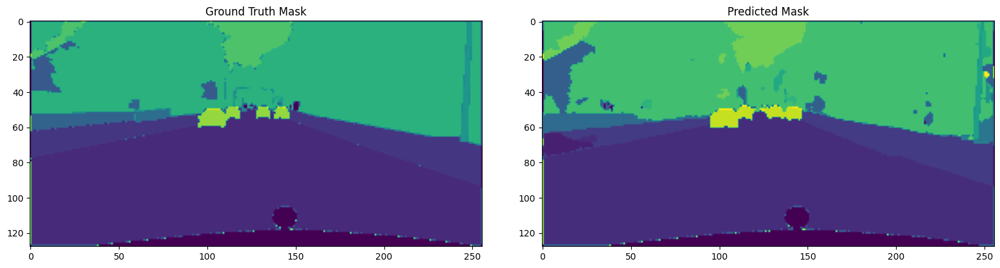

75/75 - 40s - loss: 0.2866 - accuracy: 0.9140 - mean_iou: 0.5312 - val_loss: 0.7349 - val_accuracy: 0.8436 - val_mean_iou: 0.3327 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 71/1000


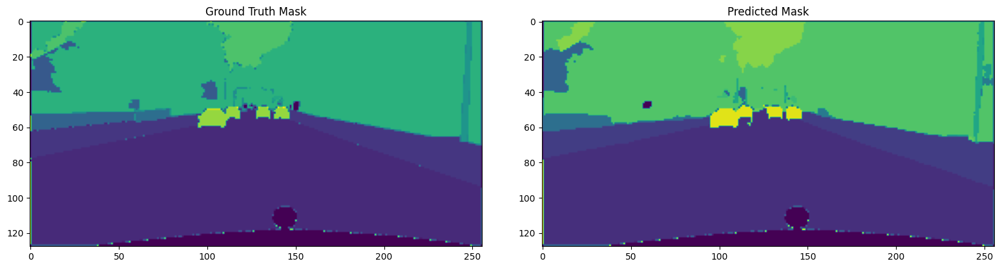

75/75 - 40s - loss: 0.1855 - accuracy: 0.9423 - mean_iou: 0.6537 - val_loss: 0.5647 - val_accuracy: 0.8699 - val_mean_iou: 0.3943 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 72/1000


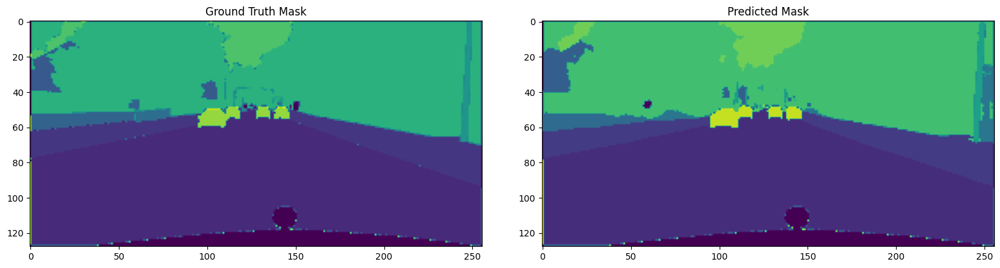

75/75 - 40s - loss: 0.1518 - accuracy: 0.9520 - mean_iou: 0.6954 - val_loss: 0.5415 - val_accuracy: 0.8810 - val_mean_iou: 0.3850 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 73/1000


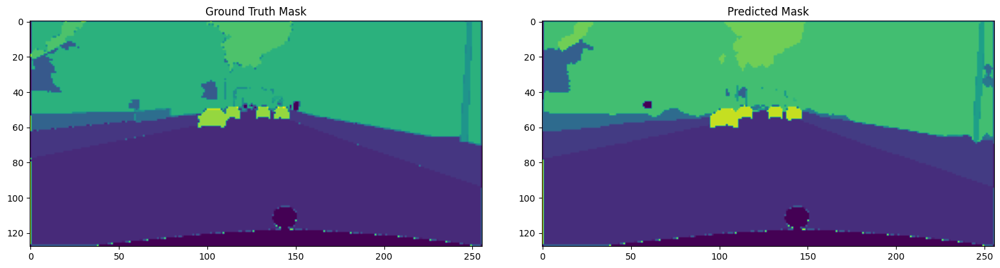

75/75 - 40s - loss: 0.1364 - accuracy: 0.9564 - mean_iou: 0.7145 - val_loss: 0.5423 - val_accuracy: 0.8852 - val_mean_iou: 0.4009 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 74/1000


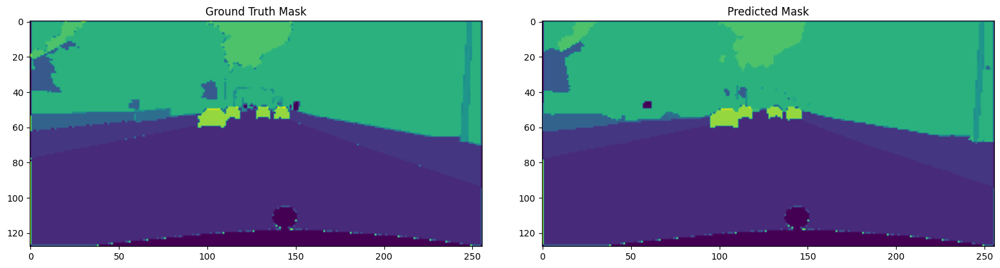

75/75 - 40s - loss: 0.1302 - accuracy: 0.9582 - mean_iou: 0.7215 - val_loss: 0.5555 - val_accuracy: 0.8873 - val_mean_iou: 0.4100 - lr: 0.0010 - 40s/epoch - 539ms/step
Epoch 75/1000


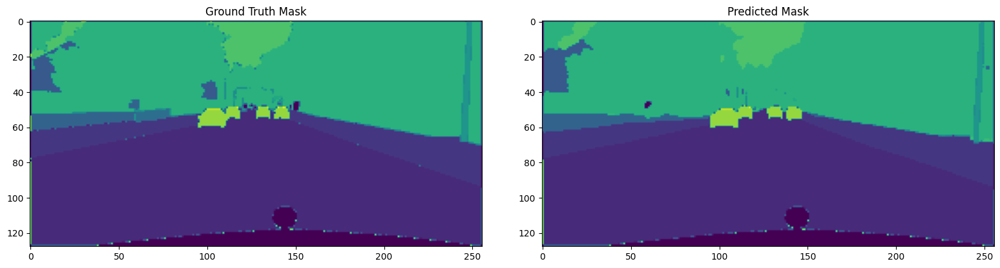

75/75 - 40s - loss: 0.1261 - accuracy: 0.9593 - mean_iou: 0.7254 - val_loss: 0.5961 - val_accuracy: 0.8866 - val_mean_iou: 0.4025 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 76/1000


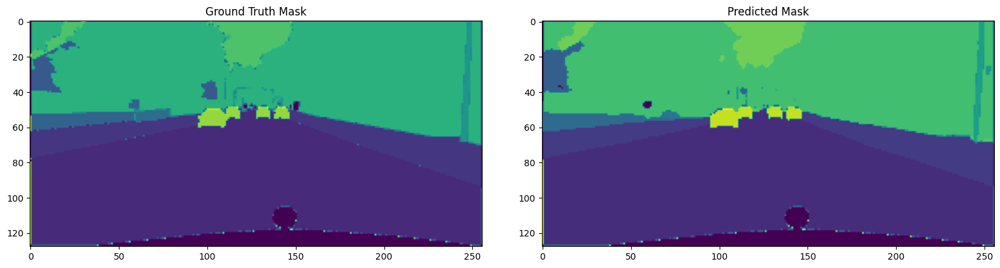

75/75 - 40s - loss: 0.1246 - accuracy: 0.9596 - mean_iou: 0.7278 - val_loss: 0.6016 - val_accuracy: 0.8863 - val_mean_iou: 0.4025 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 77/1000


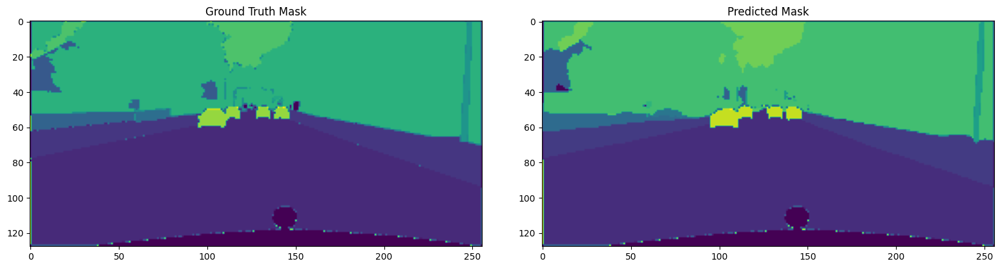

75/75 - 40s - loss: 0.1239 - accuracy: 0.9598 - mean_iou: 0.7285 - val_loss: 0.6238 - val_accuracy: 0.8847 - val_mean_iou: 0.3956 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 78/1000


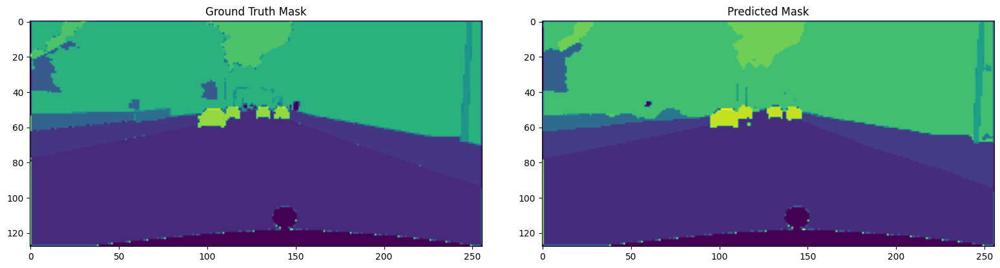

75/75 - 40s - loss: 0.1238 - accuracy: 0.9598 - mean_iou: 0.7285 - val_loss: 0.6097 - val_accuracy: 0.8850 - val_mean_iou: 0.4092 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 79/1000


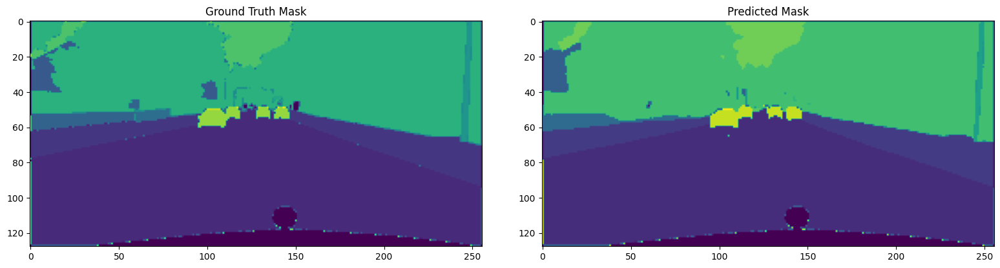

75/75 - 40s - loss: 0.1230 - accuracy: 0.9600 - mean_iou: 0.7290 - val_loss: 0.6305 - val_accuracy: 0.8867 - val_mean_iou: 0.4016 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 80/1000


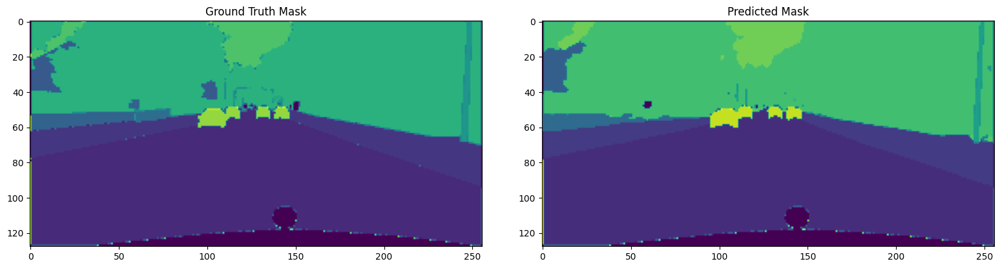

75/75 - 40s - loss: 0.1209 - accuracy: 0.9606 - mean_iou: 0.7308 - val_loss: 0.6331 - val_accuracy: 0.8839 - val_mean_iou: 0.3982 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 81/1000


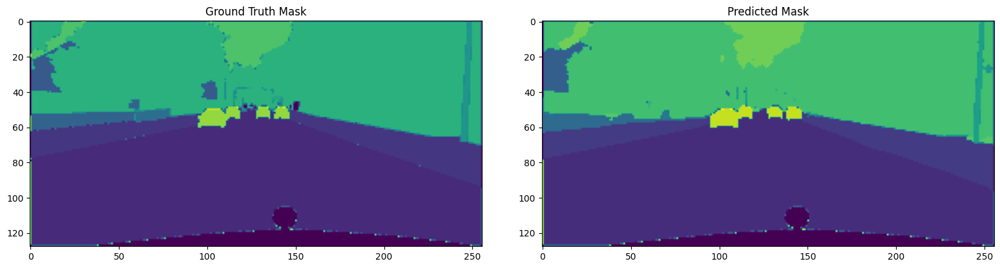

75/75 - 40s - loss: 0.1189 - accuracy: 0.9612 - mean_iou: 0.7332 - val_loss: 0.6259 - val_accuracy: 0.8853 - val_mean_iou: 0.4011 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 82/1000


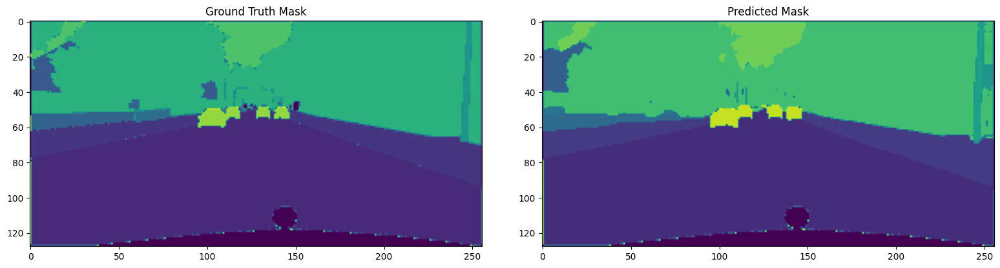

75/75 - 40s - loss: 0.1191 - accuracy: 0.9611 - mean_iou: 0.7325 - val_loss: 0.6401 - val_accuracy: 0.8840 - val_mean_iou: 0.4048 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 83/1000


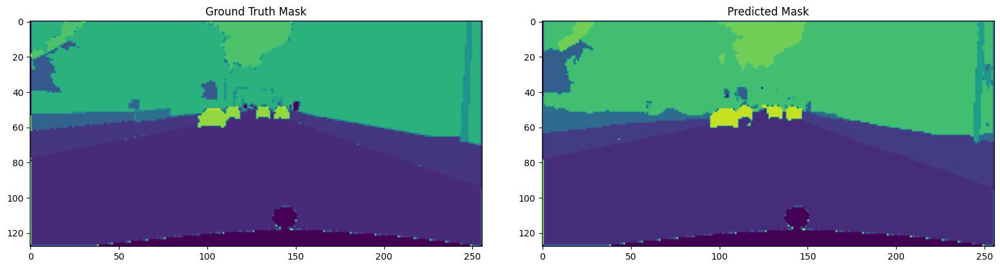

75/75 - 40s - loss: 0.1259 - accuracy: 0.9591 - mean_iou: 0.7247 - val_loss: 0.6716 - val_accuracy: 0.8826 - val_mean_iou: 0.4021 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 84/1000


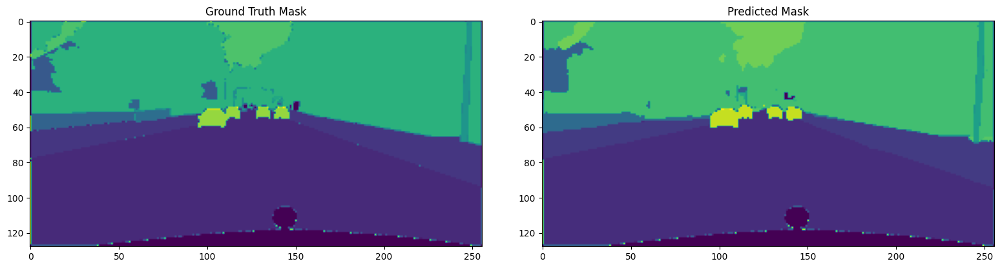

75/75 - 40s - loss: 0.1210 - accuracy: 0.9605 - mean_iou: 0.7306 - val_loss: 0.6313 - val_accuracy: 0.8847 - val_mean_iou: 0.4086 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 85/1000


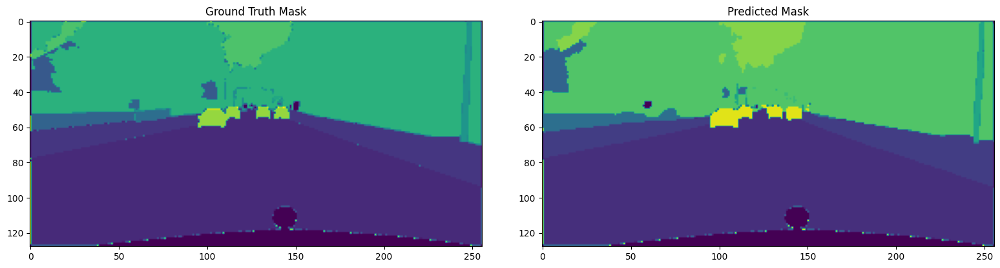

75/75 - 40s - loss: 0.1199 - accuracy: 0.9608 - mean_iou: 0.7320 - val_loss: 0.6427 - val_accuracy: 0.8852 - val_mean_iou: 0.4028 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 86/1000


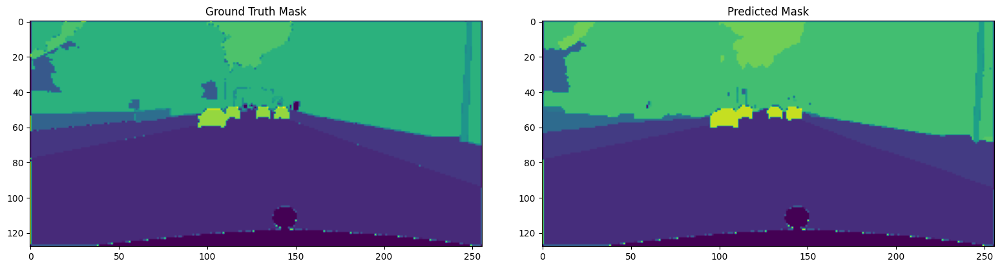

75/75 - 40s - loss: 0.1166 - accuracy: 0.9617 - mean_iou: 0.7363 - val_loss: 0.6553 - val_accuracy: 0.8858 - val_mean_iou: 0.4019 - lr: 0.0010 - 40s/epoch - 533ms/step
Epoch 87/1000


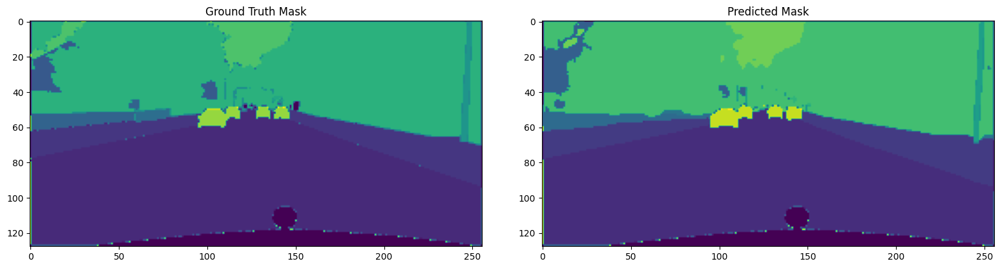

75/75 - 40s - loss: 0.1146 - accuracy: 0.9623 - mean_iou: 0.7391 - val_loss: 0.6637 - val_accuracy: 0.8834 - val_mean_iou: 0.3926 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 88/1000


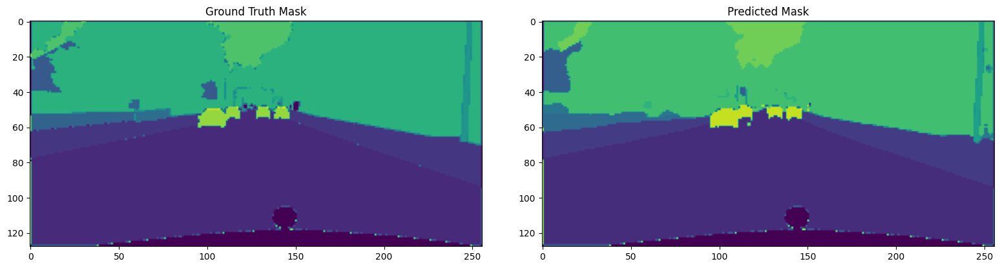

75/75 - 41s - loss: 0.1137 - accuracy: 0.9625 - mean_iou: 0.7399 - val_loss: 0.6389 - val_accuracy: 0.8866 - val_mean_iou: 0.4099 - lr: 0.0010 - 41s/epoch - 541ms/step
Epoch 89/1000


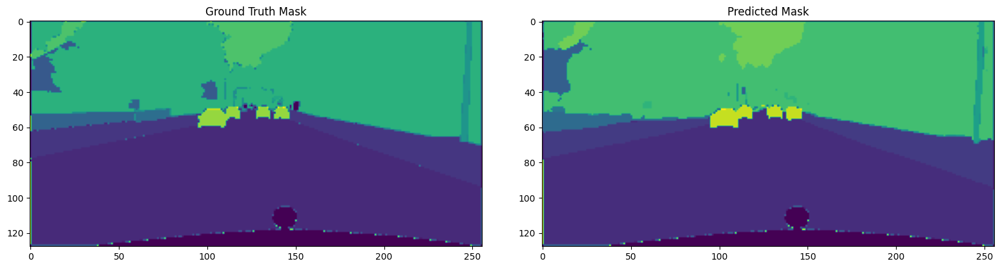

75/75 - 40s - loss: 0.1151 - accuracy: 0.9621 - mean_iou: 0.7386 - val_loss: 0.6575 - val_accuracy: 0.8870 - val_mean_iou: 0.4131 - lr: 0.0010 - 40s/epoch - 539ms/step
Epoch 90/1000


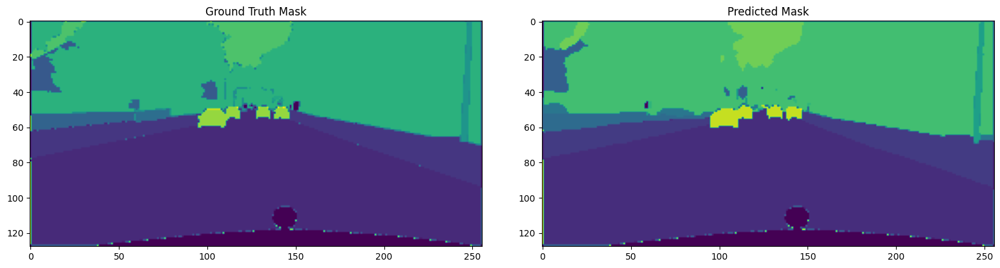

75/75 - 40s - loss: 0.1136 - accuracy: 0.9626 - mean_iou: 0.7399 - val_loss: 0.6555 - val_accuracy: 0.8868 - val_mean_iou: 0.4075 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 91/1000


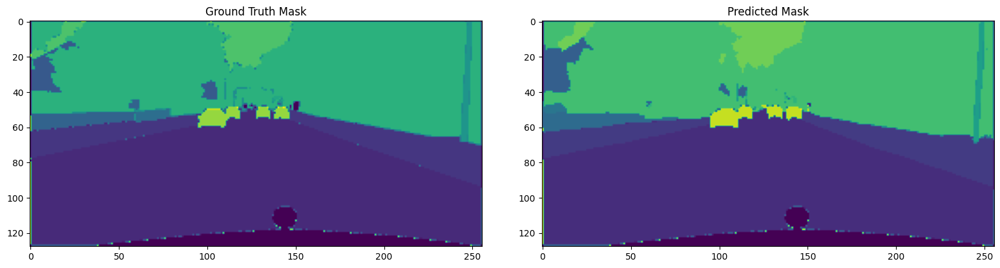

75/75 - 40s - loss: 0.1120 - accuracy: 0.9630 - mean_iou: 0.7415 - val_loss: 0.6827 - val_accuracy: 0.8851 - val_mean_iou: 0.4048 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 92/1000


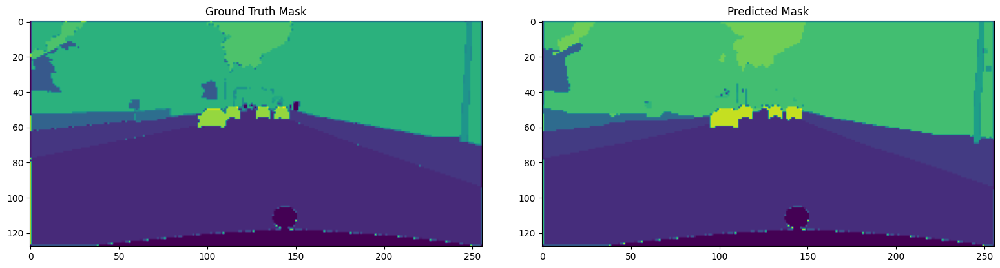

75/75 - 40s - loss: 0.1111 - accuracy: 0.9633 - mean_iou: 0.7428 - val_loss: 0.6626 - val_accuracy: 0.8851 - val_mean_iou: 0.4040 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 93/1000


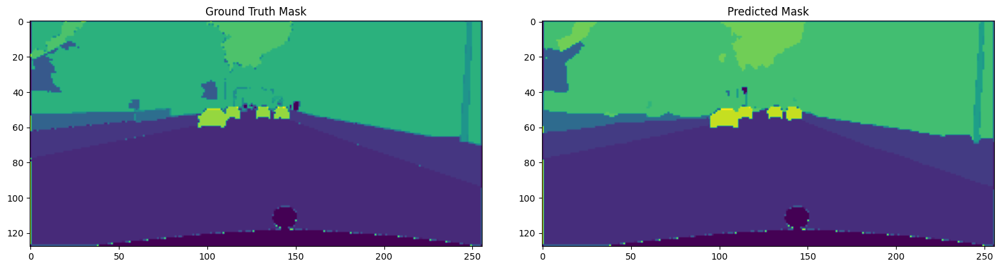

75/75 - 40s - loss: 0.1096 - accuracy: 0.9637 - mean_iou: 0.7448 - val_loss: 0.6715 - val_accuracy: 0.8827 - val_mean_iou: 0.3986 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 94/1000


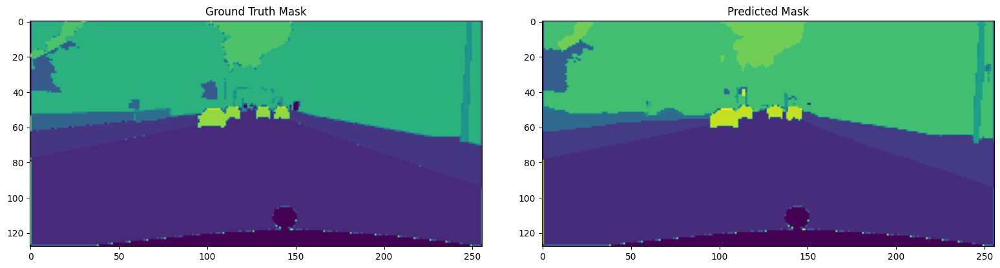

75/75 - 40s - loss: 0.1120 - accuracy: 0.9629 - mean_iou: 0.7417 - val_loss: 0.6667 - val_accuracy: 0.8821 - val_mean_iou: 0.4024 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 95/1000


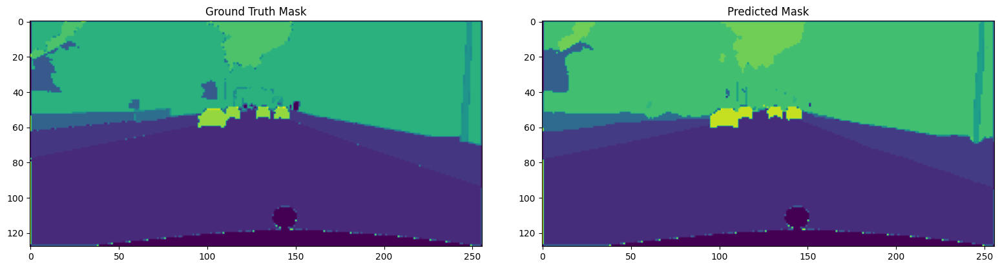

75/75 - 40s - loss: 0.1110 - accuracy: 0.9632 - mean_iou: 0.7428 - val_loss: 0.6859 - val_accuracy: 0.8844 - val_mean_iou: 0.3972 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 96/1000


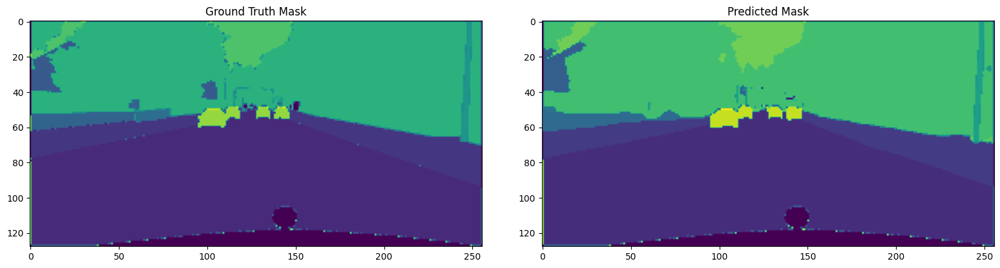

75/75 - 40s - loss: 0.1102 - accuracy: 0.9635 - mean_iou: 0.7437 - val_loss: 0.6663 - val_accuracy: 0.8852 - val_mean_iou: 0.4107 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 97/1000


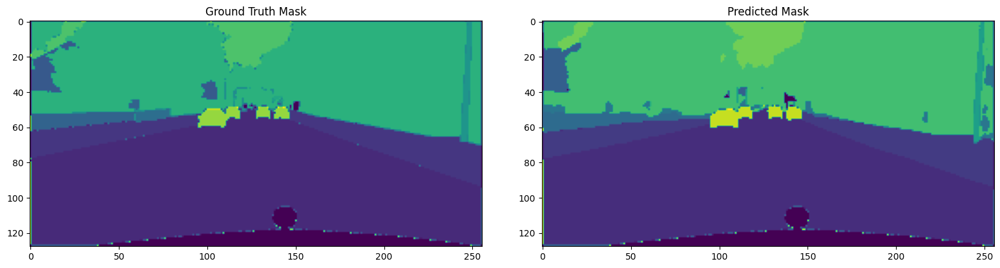

75/75 - 40s - loss: 0.1081 - accuracy: 0.9641 - mean_iou: 0.7463 - val_loss: 0.6983 - val_accuracy: 0.8821 - val_mean_iou: 0.3851 - lr: 0.0010 - 40s/epoch - 536ms/step
Epoch 98/1000


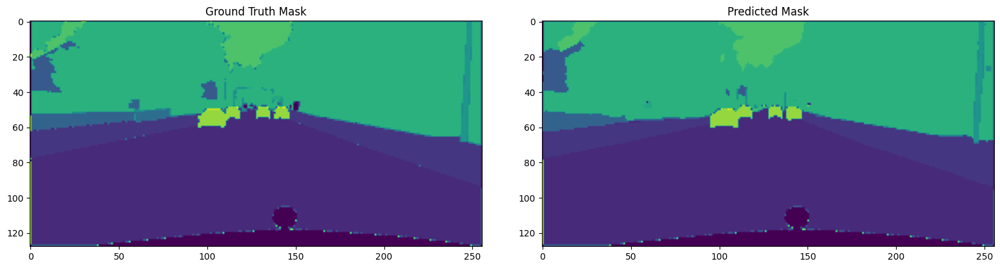

75/75 - 40s - loss: 0.1105 - accuracy: 0.9634 - mean_iou: 0.7432 - val_loss: 0.6981 - val_accuracy: 0.8866 - val_mean_iou: 0.4081 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 99/1000


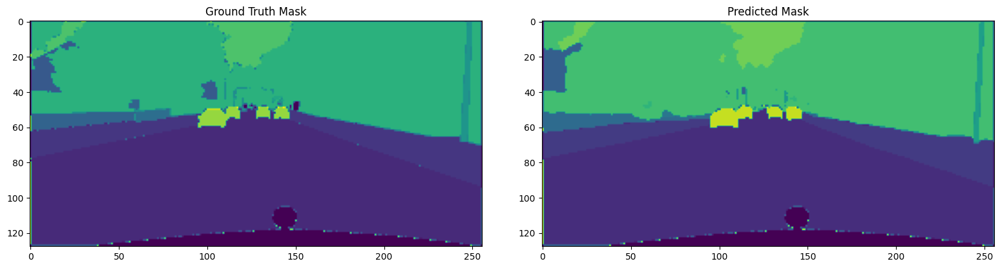

75/75 - 40s - loss: 0.1090 - accuracy: 0.9638 - mean_iou: 0.7451 - val_loss: 0.6862 - val_accuracy: 0.8838 - val_mean_iou: 0.4027 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 100/1000


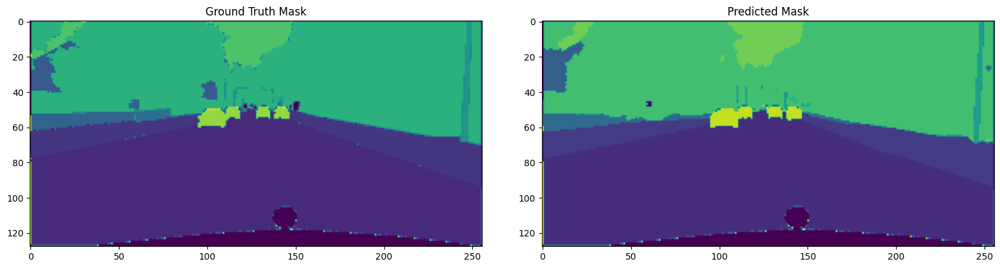

75/75 - 40s - loss: 0.1069 - accuracy: 0.9644 - mean_iou: 0.7489 - val_loss: 0.6970 - val_accuracy: 0.8827 - val_mean_iou: 0.3941 - lr: 0.0010 - 40s/epoch - 530ms/step
Epoch 101/1000


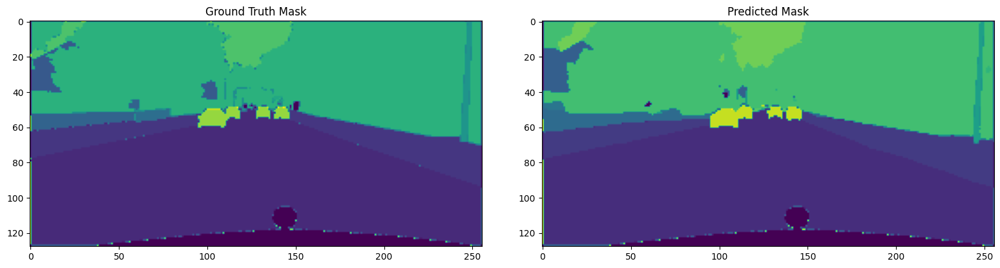

75/75 - 40s - loss: 0.1049 - accuracy: 0.9650 - mean_iou: 0.7502 - val_loss: 0.7083 - val_accuracy: 0.8844 - val_mean_iou: 0.3927 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 102/1000


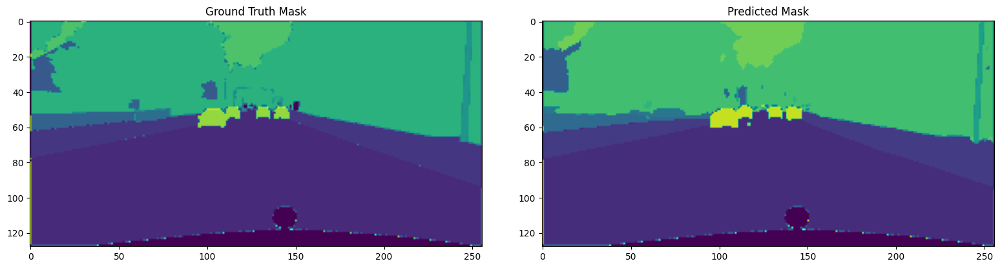

75/75 - 40s - loss: 0.1045 - accuracy: 0.9651 - mean_iou: 0.7510 - val_loss: 0.6889 - val_accuracy: 0.8839 - val_mean_iou: 0.4045 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 103/1000


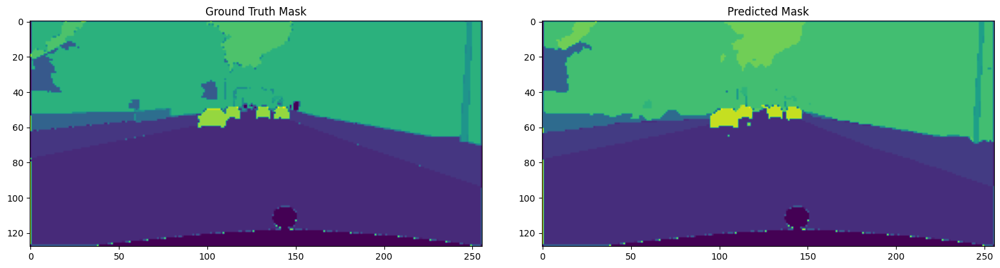

75/75 - 40s - loss: 0.1053 - accuracy: 0.9649 - mean_iou: 0.7498 - val_loss: 0.6847 - val_accuracy: 0.8823 - val_mean_iou: 0.4011 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 104/1000


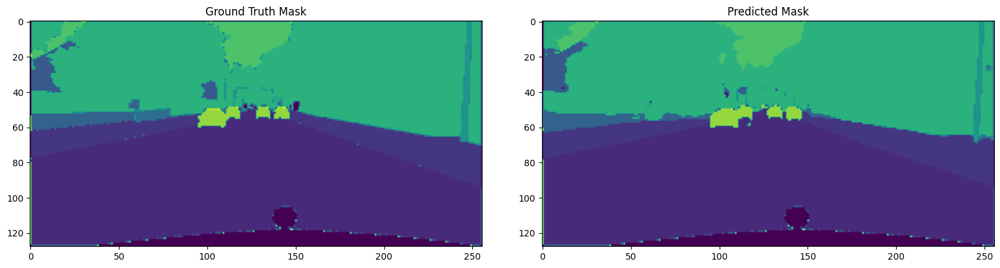

75/75 - 40s - loss: 0.1048 - accuracy: 0.9650 - mean_iou: 0.7505 - val_loss: 0.6998 - val_accuracy: 0.8815 - val_mean_iou: 0.4030 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 105/1000


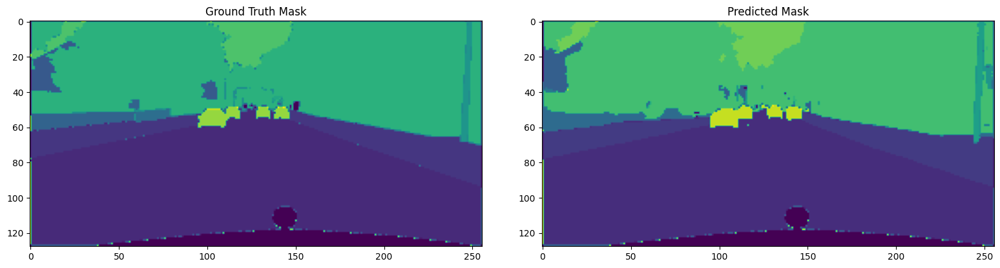

75/75 - 40s - loss: 0.1035 - accuracy: 0.9653 - mean_iou: 0.7525 - val_loss: 0.6875 - val_accuracy: 0.8833 - val_mean_iou: 0.3995 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 106/1000


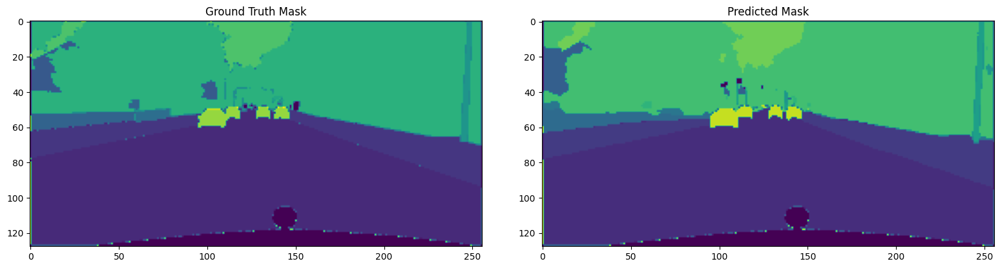

75/75 - 40s - loss: 0.1030 - accuracy: 0.9655 - mean_iou: 0.7535 - val_loss: 0.7220 - val_accuracy: 0.8824 - val_mean_iou: 0.3924 - lr: 0.0010 - 40s/epoch - 534ms/step
Epoch 107/1000


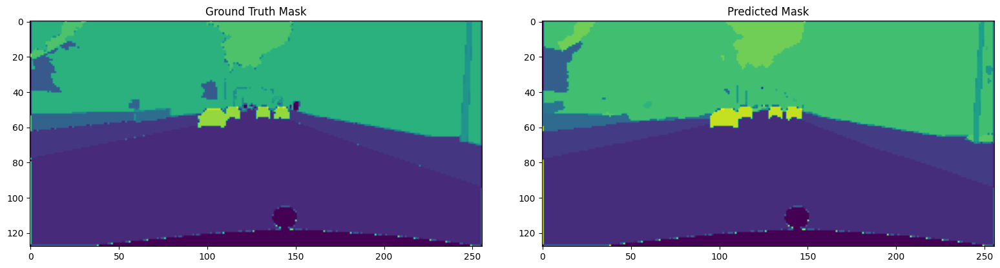

75/75 - 40s - loss: 0.1036 - accuracy: 0.9653 - mean_iou: 0.7523 - val_loss: 0.7053 - val_accuracy: 0.8826 - val_mean_iou: 0.3992 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 108/1000


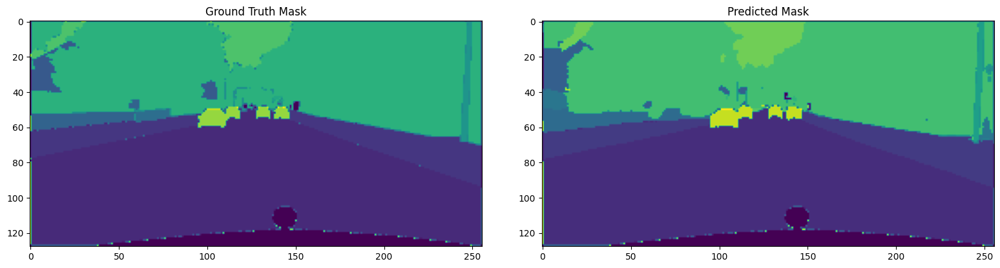

75/75 - 40s - loss: 0.1036 - accuracy: 0.9653 - mean_iou: 0.7528 - val_loss: 0.7012 - val_accuracy: 0.8838 - val_mean_iou: 0.4048 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 109/1000


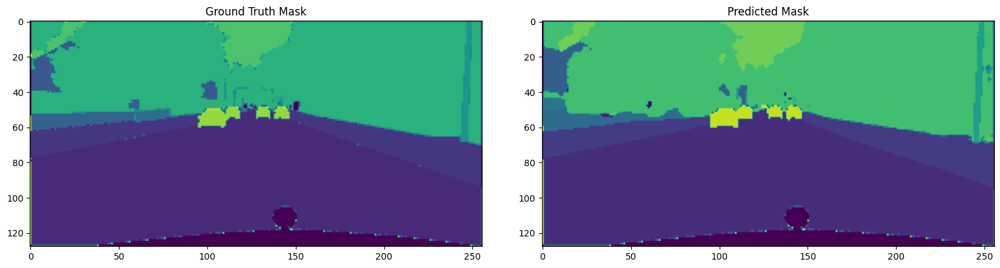

75/75 - 40s - loss: 0.1046 - accuracy: 0.9650 - mean_iou: 0.7513 - val_loss: 0.7051 - val_accuracy: 0.8835 - val_mean_iou: 0.4038 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 110/1000


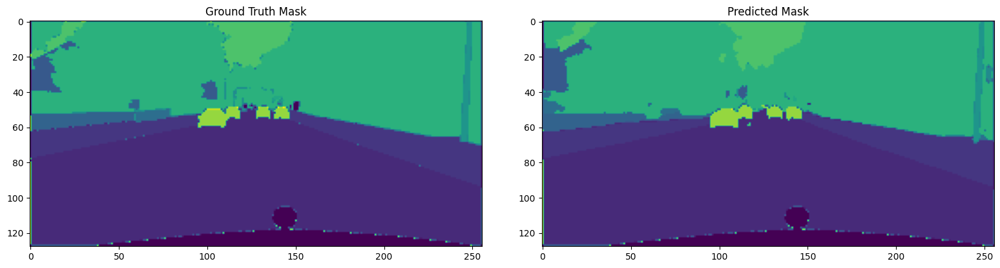

75/75 - 40s - loss: 0.1011 - accuracy: 0.9660 - mean_iou: 0.7558 - val_loss: 0.7369 - val_accuracy: 0.8820 - val_mean_iou: 0.4004 - lr: 0.0010 - 40s/epoch - 531ms/step
Epoch 111/1000


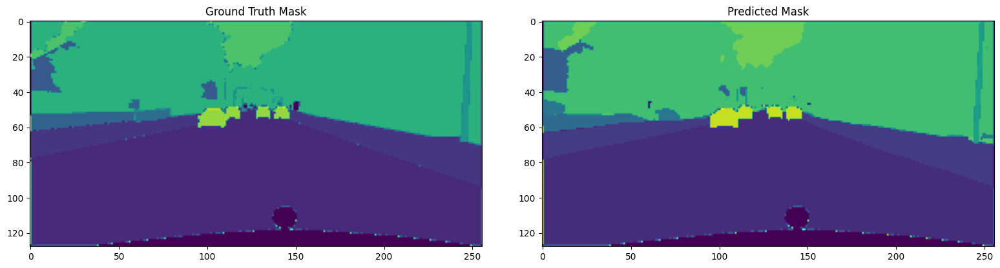

75/75 - 40s - loss: 0.0996 - accuracy: 0.9665 - mean_iou: 0.7581 - val_loss: 0.7364 - val_accuracy: 0.8844 - val_mean_iou: 0.4020 - lr: 0.0010 - 40s/epoch - 532ms/step
Epoch 112/1000


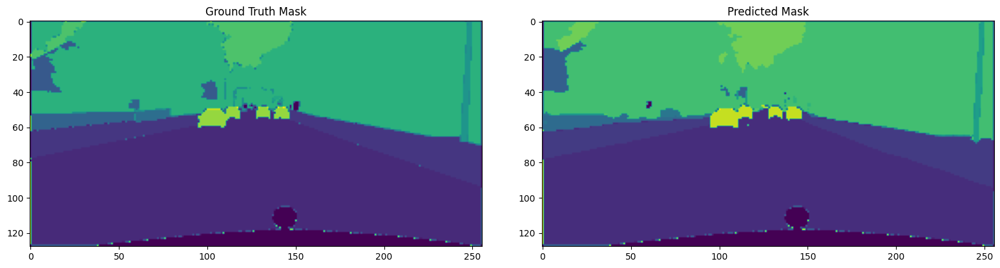

75/75 - 40s - loss: 0.0977 - accuracy: 0.9670 - mean_iou: 0.7600 - val_loss: 0.7780 - val_accuracy: 0.8823 - val_mean_iou: 0.3821 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 113/1000


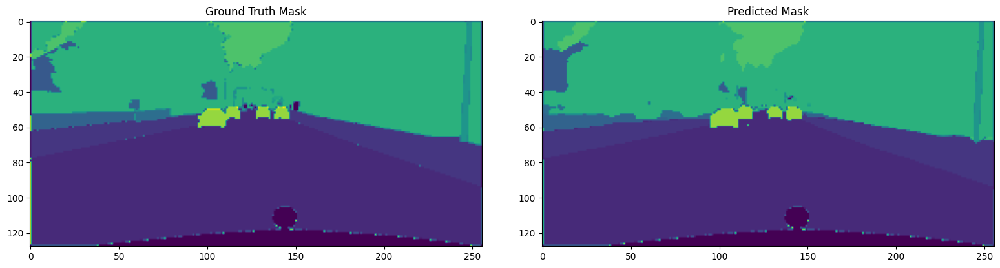

75/75 - 40s - loss: 0.0981 - accuracy: 0.9669 - mean_iou: 0.7598 - val_loss: 0.7382 - val_accuracy: 0.8841 - val_mean_iou: 0.3975 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 114/1000


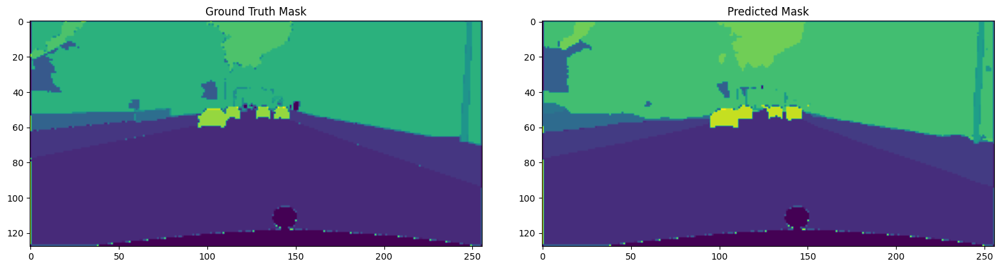

75/75 - 40s - loss: 0.0982 - accuracy: 0.9669 - mean_iou: 0.7597 - val_loss: 0.7811 - val_accuracy: 0.8831 - val_mean_iou: 0.4027 - lr: 0.0010 - 40s/epoch - 535ms/step
Epoch 115/1000


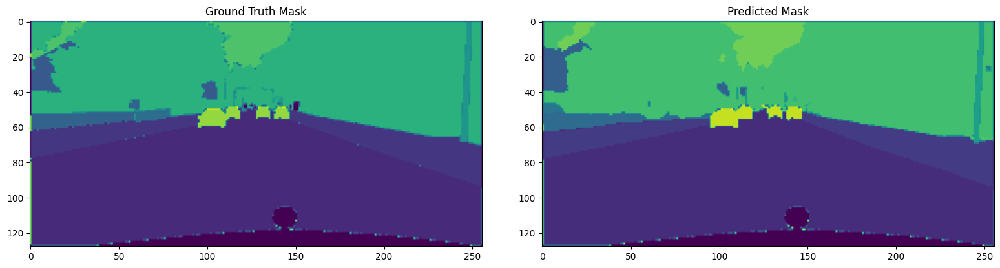

75/75 - 40s - loss: 0.0916 - accuracy: 0.9689 - mean_iou: 0.7697 - val_loss: 0.7194 - val_accuracy: 0.8872 - val_mean_iou: 0.4104 - lr: 1.0000e-04 - 40s/epoch - 540ms/step
Epoch 116/1000


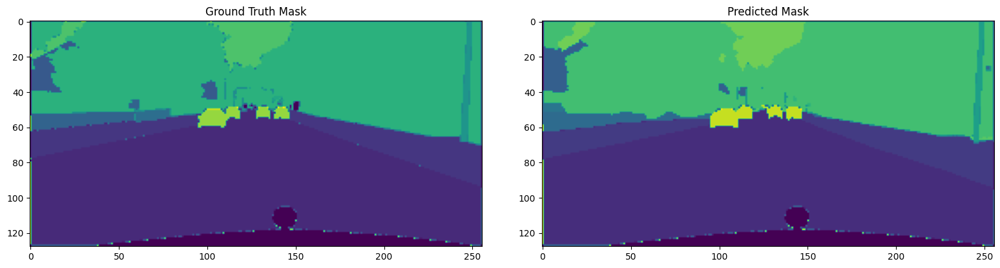

75/75 - 40s - loss: 0.0869 - accuracy: 0.9704 - mean_iou: 0.7772 - val_loss: 0.7274 - val_accuracy: 0.8873 - val_mean_iou: 0.4097 - lr: 1.0000e-04 - 40s/epoch - 535ms/step
Epoch 117/1000


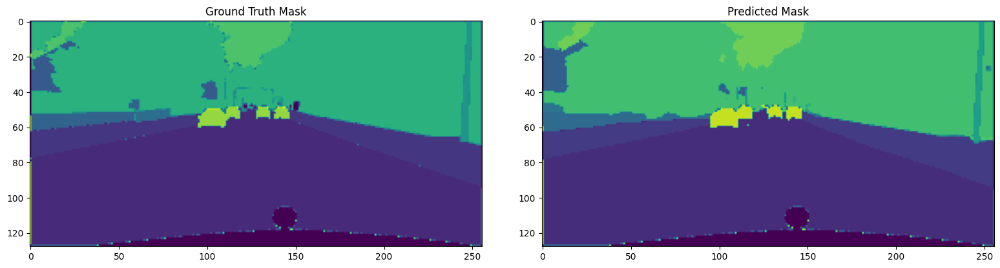

75/75 - 40s - loss: 0.0851 - accuracy: 0.9710 - mean_iou: 0.7800 - val_loss: 0.7360 - val_accuracy: 0.8874 - val_mean_iou: 0.4099 - lr: 1.0000e-04 - 40s/epoch - 532ms/step
Epoch 118/1000


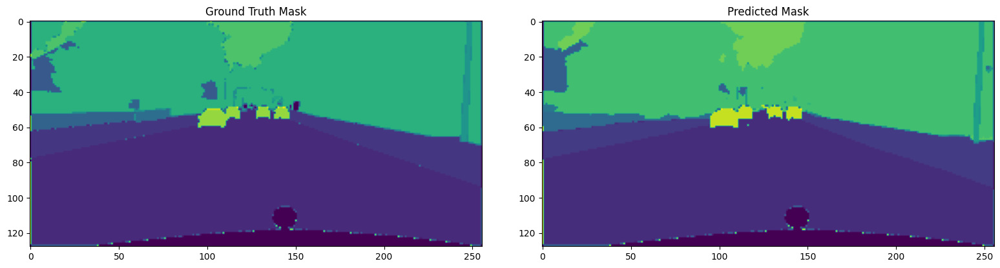

75/75 - 40s - loss: 0.0839 - accuracy: 0.9714 - mean_iou: 0.7820 - val_loss: 0.7458 - val_accuracy: 0.8876 - val_mean_iou: 0.4107 - lr: 1.0000e-04 - 40s/epoch - 532ms/step
Epoch 119/1000


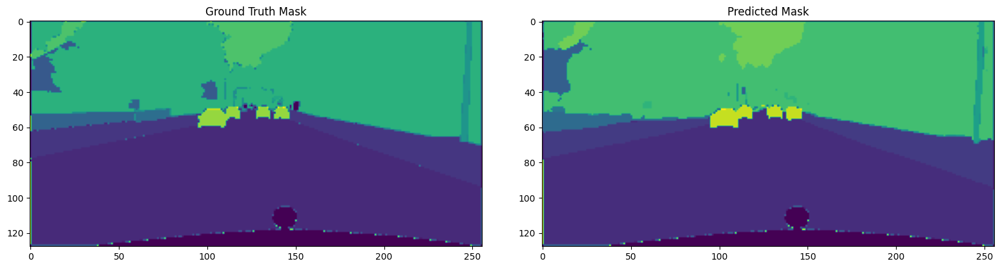

75/75 - 40s - loss: 0.0830 - accuracy: 0.9716 - mean_iou: 0.7832 - val_loss: 0.7545 - val_accuracy: 0.8869 - val_mean_iou: 0.4092 - lr: 1.0000e-04 - 40s/epoch - 537ms/step


In [ ]:
history = model.fit(
    x=X_train,
    y=y_train,
    epochs = epochs,
    batch_size = batch_size,
    validation_data = (X_val, y_val),
    callbacks=[early_stopping, viz_callback, scheduler],
    verbose=2
    )

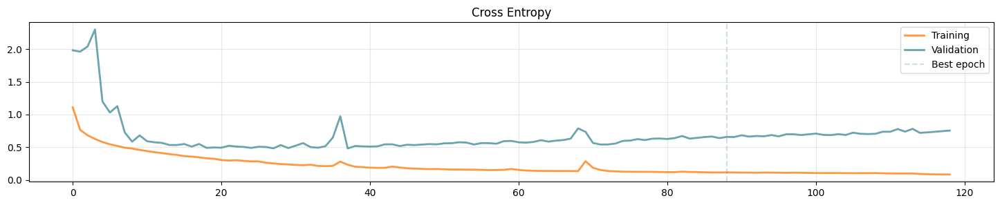

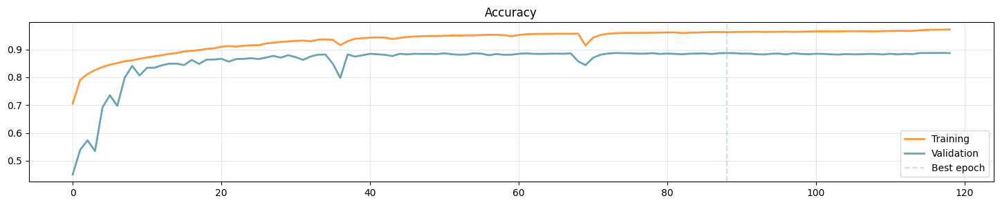

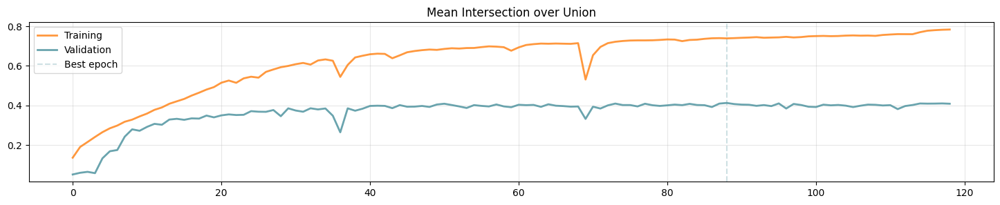

In [ ]:
best_epoch = np.argmax(history.history['val_mean_iou'])
plt.figure(figsize=(18,3))
plt.plot(history.history['loss'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Cross Entropy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(18,3))
plt.plot(history.history['accuracy'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_accuracy'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(18,3))
plt.plot(history.history['mean_iou'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_mean_iou'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Mean Intersection over Union')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [ ]:
# model.save('UNet')
del model

### Make inference

In [ ]:
# Load UNet model without compiling
model = tfk.models.load_model('UNet', compile=False)

# Compile the model with specified loss, optimizer, and metrics
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer=tfk.optimizers.AdamW(learning_rate),
    metrics=["accuracy", UpdatedMeanIoU(num_classes=num_classes)]
)

# Display the model summary
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None, 128, 256, 3)]        0         []                            
                                                                                                  
 down_block1_conv1 (Conv2D)  (None, 128, 256, 64)         1792      ['input_layer[0][0]']         
                                                                                                  
 down_block1_bn1 (BatchNorm  (None, 128, 256, 64)         256       ['down_block1_conv1[0][0]']   
 alization)                                                                                       
                                                                                                  
 down_block1_activation1 (A  (None, 128, 256, 64)         0         ['down_block1_bn1[0][0]'

In [ ]:
# Evaluate the model on the test set and print the results
test_loss, test_accuracy, test_mean_iou = model.evaluate(X_test, y_test, verbose=0, batch_size=10)
print(f'Test Accuracy: {round(test_accuracy, 4)}')
print(f'Test Mean Intersection over Union: {round(test_mean_iou, 4)}')

Test Accuracy: 0.8854
Test Mean Intersection over Union: 0.4042


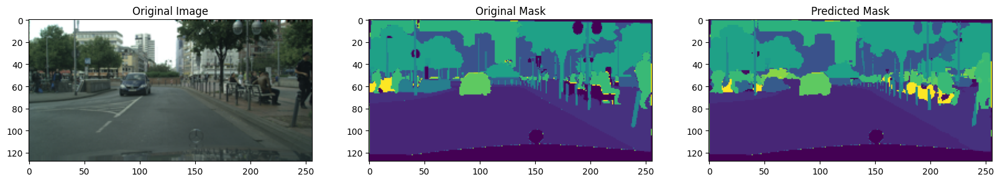

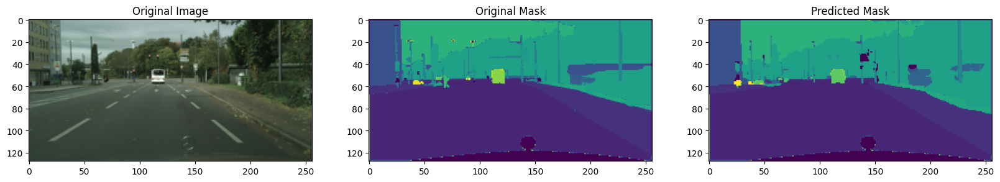

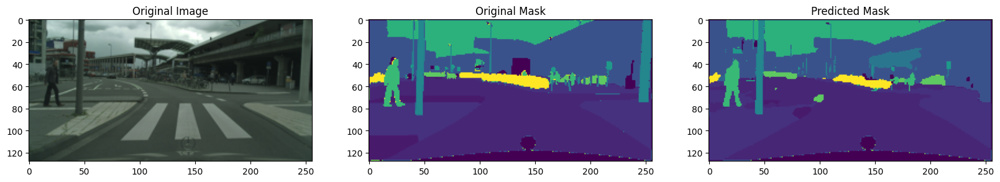

In [ ]:
# Define a function to plot triptychs for model predictions
def plot_triptychs(data, labels, index=None):
    # If index is not specified, randomly select one
    if index is None:
        index = np.random.randint(0, len(data))

    # Generate predictions for the selected index
    pred = model.predict(np.expand_dims(data[index], axis=0), verbose=0)
    pred = np.array(tf.math.argmax(pred, axis=-1))
    pred = np.reshape(pred, (128, 256, 1))

    # Plot the original image, original mask, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(20, 4))
    axes[0].set_title("Original Image")
    axes[0].imshow(data[index])
    axes[1].set_title("Original Mask")
    colored_image = display_color_mapped_image_continuous(labels[index])
    axes[1].imshow(np.squeeze(colored_image))
    axes[2].set_title("Predicted Mask")
    colored_image = display_color_mapped_image_continuous(pred)
    axes[2].imshow(np.squeeze(colored_image))
    plt.show()

# Plot triptychs for three random samples from the test set
plot_triptychs(X_test, y_test)
plot_triptychs(X_test, y_test)
plot_triptychs(X_test, y_test)

*Credits: Eugenio Lomurno, 📧 eugenio.lomurno@polimi.it*